In [1]:
!pip install emoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 433.8/433.8 kB 4.3 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
import string
import emoji
from scipy.stats import shapiro, chi2_contingency, mannwhitneyu, ttest_ind, kruskal

import warnings
warnings.filterwarnings("ignore")
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
from statsmodels.stats.proportion import proportions_ztest
import folium

# Background
Airbnb adalah sebuah perusahaan yang bergerak di bidang perhotelan. Airbnb menawarkan berbagai pilihan untuk pelancong, dari kamar hotel, rumah, resort, condominium, bahkan kamar bersama. Airbnb menawarkan short-term maupun long-term stay, sehingga cocok bagi seorang turis ataupun warga menetap.

Sebagai kota yang kaya akan budaya, Bangkok tak jarang menjadi destinasi wisata favorit. Mulai dari *night market* yang menjual kuliner khas Thailand, *club* malam gemerlap, hingga pantai yang memanjakan mata, semua ada di Bangkok.

Airbnb hadir di Bangkok untuk memudahkan para turis lokal dan mancanegara untuk berwisata di Bangkok tanpa mengkhawatirkan akomodasi. Fitur Airbnb yang memungkinkan ulasan hanya dari tamu yang telah melakukan pemesanan lewat Airbnb, memberikan bantuan bagi wisatawan dalam menemukan listing yang sesuai dengan preferensi mereka.

Pada analisis ini kita akan fokus pada `price` dan melihat apa saja variabel yang memengaruhinya.


## Problem Statement
Tarif sewa pada Airbnb dipasang oleh host [(source)](https://www.airbnb.com/help/article/125#:~:text=The%20total%20price%20of%20your,may%20include%20taxes%20as%20well.). Maka dari itu, dengan memahami faktor-faktor yang mempengaruhi tarif kamar, Airbnb dapat memberikan rekomendasi kepada para host homestay untuk menetapkan harga yang lebih optimal. Host yang menggunakan platform Airbnb harus membayar biaya layanan kepada Airbnb, yaitu 3% dari subtotal yang dibayar penyewa [(source)](https://www.airbnb.com/resources/hosting-homes/a/how-much-does-airbnb-charge-hosts-288). Dengan demikian, **semakin optimal harga yang ditetapkan oleh host, semakin tinggi pendapatan yang diperoleh oleh Airbnb melalui biaya layanan**.
Namun, tantangan muncul dalam menyeimbangkan antara harga yang kompetitif dan memastikan keuntungan maksimal bagi host dan platform. Selain itu, banyaknya listing yang kurang populer meninimalisir profitabilitas sebuah listing.

Sebagai data analyst, kita akan menjawab pertanyaan berikut ini:

1.   Bagaimana karakteristik sebuah listing memengaruhi tarif harian yang ditetapkan oleh host? Apa saja faktor yang memengaruhi tarif harian listing? Apa yang dapat dilakukan untuk meningkatkan profit host? Bagaimana cara menetapkan harga yang bersaing?
2.   Bagaimana karakteristik dari listing yang populer? Apa langkah yang dapat diambil untuk meningkatkan popularitas listing?
3.   Bagaimana bahasa dari judul listing memengaruhi tarif harian listing dan popularitas listing?




# Data
Untuk menjawab pertanyaan di atas, kita akan menganalisa data peserta yang sudah dikumpulkan oleh perusahaan. Dataset dapat diakses [di sini](https://drive.google.com/drive/folders/1A_KBMRFTS5Mthpp46nulso679ML4ZwTF).

Dataset ini berisi informasi terkait lokasi, tipe kamar, host, harga, minimal jumlah hari yang disewa, ketersediaan, dan review yang didapat oleh listing  

* id: ID unik untuk listing
* name: nama dari listing
* host_id: ID unik untuk setiap host listing
* host_name: nama host listing
* neighbourhood: daerah listing
* latitude: garis lintang lokasi listing
* longitude: garis bujur lokasi listing
* room_type: tipe kamar dari listing (Entire home/apt, Private room, Shared room, Hotel)
* price: tarif listing per hari
* minimum_nights: minimal jumlah malam yang disewa
* number_of_reviews: jumlah review yang didapat oleh listing
* last_review: tanggal dari review terakhir
* reviews_per_month: jumlah review yang didapat per bulan
* calculated_host_listings_count: jumlah listing yang dimiliki oleh host di sebuah daerah
* availability_365: ketersediaan listing 365 hari ke depan
* number_of_reviews_ltm: jumlah review yang dimiliki listing selama setahun kebelakang


Berikut 5 baris teratas dari dataset 'Airbnb Listings Bangkok.csv'

In [3]:
df = pd.read_csv('Airbnb Listings Bangkok.csv')
df.head()

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


## Data Understanding
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih jauh dalam tahapan *data understanding*. Dari proses ini, kita akan tahu anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan *data cleaning*. Setiap penanganan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik.

Pertama-tama, kita harus menghapus kolom 'Unnamed: 0' dari df

In [4]:
df = df.drop('Unnamed: 0', axis = 1)
df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


Kemudian, kita akan melihat data type dan jumlah data non-null dari setiap variabel dalam dataset

In [5]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (15854, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15854 non-null  int64  
 1   name                            15846 non-null  object 
 2   host_id                         15854 non-null  int64  
 3   host_name                       15853 non-null  object 
 4   neighbourhood                   15854 non-null  object 
 5   latitude                        15854 non-null  float64
 6   longitude                       15854 non-null  float64
 7   room_type                       15854 non-null  object 
 8   price                           15854 non-null  int64  
 9   minimum_nights                  15854 non-null  int64  
 10  number_of_reviews               15854 non-null  int64  
 11  last_review                     10064

Lalu, kita akan melihat jumlah data, nilai mean, standar deviasi, min, max, dan kuartil dari setiap fitur numerik

In [6]:
display(df.describe())

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,1.585400e+04,1.585400e+04,15854.000000,15854.000000,1.585400e+04,15854.000000,15854.000000,10064.000000,15854.000000,15854.000000,15854.000000
mean,1.579397e+17,1.541058e+08,13.745144,100.559903,3.217704e+03,15.292355,16.654157,0.813145,13.889618,244.378643,3.481519
std,2.946015e+17,1.318726e+08,0.043040,0.050911,2.497212e+04,50.815020,40.613331,1.090196,30.269848,125.843224,8.916937
min,2.793400e+04,5.892000e+04,13.527300,100.329550,0.000000e+00,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.104509e+07,3.974431e+07,13.720090,100.529690,9.000000e+02,1.000000,0.000000,0.120000,1.000000,138.000000,0.000000
50%,3.503734e+07,1.224556e+08,13.738490,100.561415,1.429000e+03,1.000000,2.000000,0.435000,4.000000,309.000000,0.000000
75%,5.256154e+07,2.390547e+08,13.759497,100.585150,2.429000e+03,7.000000,13.000000,1.060000,13.000000,360.000000,3.000000
max,7.908162e+17,4.926659e+08,13.953540,100.923440,1.100000e+06,1125.000000,1224.000000,19.130000,228.000000,365.000000,325.000000


Setelah itu, kita akan melihat jumlah data, jumlah nilai unique, modus beserta frekuensi dari fitur kategorik

In [7]:
display(df.describe(include='object'))

,name,host_name,neighbourhood,room_type,last_review
count,15846,15853,15854,15854,10064
unique,14794,5312,50,4,1669
top,New! La Chada Night Market studio 2PPL near MRT,Curry,Vadhana,Entire home/apt,2022-12-11
freq,45,228,2153,8912,189


Di sini, kita akan menampilkan nilai unique dari setiap variabel dan menyatukannya ke dalam dataframe

In [8]:
pd.set_option('display.max_colwidth', 1)
# data unik di tiap variabel
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,id,15854,"[27934, 27979, 28745, 35780, 941865, 1704776, 48736, 1738669, 1744248, 952677, 55681, 1765918, 55686, 59221, 959254, 62217, 1791481, 66046, 105042, 1793000, 960858, 113744, 965722, 1808600, 118118, 1816517, 969792, 121410, 145343, 973830, 156583, 1823321, 159854, 976690, 978531, 166267, 169285, 978969, 1842066, 169514, 1849029, 1862089, 985743, 988373, 172332, 1016487, 1862331, 1862377, 185364, 1887544, 1888303, 1019241, 241416, 1026451, 1028469, 1028486, 1035589, 1035640, 1897982, 296960, 1898332, 1041976, 313459, 1052180, 1926489, 320014, 1933894, 1057173, 1060320, 384924, 1067748, 1077493, 1943048, 385130, 385278, 385979, 390611, 1947314, 1079039, 1086843, 393066, 397449, 405662, 1088343, 1094136, 1961981, 407381, 1975849, 1133843, 413824, 428360, 428421, 428907, 428950, 430691, 430703, 430706, 432004, 439051, 1138679, ...]"
1,name,14794,"[Nice room with superb city view, Easy going landlord,easy place, modern-style apartment in Bangkok, Spacious one bedroom at The Kris Condo Bldg. 3, Suite Room 3 at MetroPoint, NEw Pro!! Bungalow Bkk Centre, Condo with Chaopraya River View, 1 chic bedroom apartment in BKK, Batcave, Pool view, near Chatuchak, Standard Room Decor do Hostel, Sathorn Terrace Apartment(61), 2BR apt in a cozy neighborhood, Comfy bedroom near River pier & BTS Taksin., budget hotel bangkok near subway, Deluxe Condo, Nana, Pool/GYM/Sauna, Luxury@swimpool/FreeWiFi/nearJJMkt, Nice and Quiet condo near BTS Onnut, 24Flr- 1br Apt near JJ, MRT, BTS, Central Bangkok 3 Bedroom Apartment, The Duplex - Asoke- Luxury 92sqm, New, Stylish & Luxury Studio Condo, River View - Ivy Condo (1 Bedroom), Siamese Gioia on Sukhumvit 31, Contemporary Modern Duplex-Thong Lo, Pan Dao Condo 5 min from BTS On Nut, 1 BR condominium center BKK +NETFLIX+55SQM, 1 penthouse in central Bangkok, MetroPoint Suite Room, Near Airport, Boutique Rooms Near Bangkok Airport, BangLuang House1 @ Bangkok Thailand, Studio near Chula University/Silom walk to MRT/BTS, กรองทองแมนชั่น (ลาดพร้าว 81), Deluxe one Bedroom Condo w.Pool-GYM & Sauna 8-7, Beautiful 1 BR apartment @BTS Ari, Urban Oasis in the heart of Bangkok, 1Bed apt. near Chula University/Silom, Stay at the ROARING RATCHADA!, 60 m2 apartment in Thong Lor, Bangkok, ICONSIAM River view on 49th floor, 2br apt in Sukhumvit Asoke near BTS, Self catering cozy1-bed near BTS, ❂☀☀☀Perfect Escape☀☀☀Sunny Roof EnSuite☀☀☀☀, Room with city view of BKK, BangLuang House 2@ Bangkok Thailand, Tranquility found in busy Bangkok near new skytran, Private room in Bangkok, ☞✪✪✪✪Roomy Studio 4 Family r friends✪No Stairs✪✪✪✪, ☞Downtown Central Studio-Bangkok MRT, Beautiful Wood Bangkok Resort House, ""Serviced 2 Bed Scenic SkyVillas"", Cozy 1BR rooftop (BTS Ploenchit) heart of bangkok, Chic two bedroom for Monthly rental, Sukhumvit52 near SkyTrain to BkkCBD, ♡Chic Studio, Easy Walk to Pier & BTS Taksin♡, One Bedroom Suite- WIFI- SATHORN, STUDIO RM2 - WIFI- SATHORN, Quiet Double Bed Apartment, Quiet Double Bed Apartment, Suvarnabhumi free transfer, Luxury&Comfy wthWifi walk-distance to Subwy-Malls, Apr. for rent full fur 1 bedroom, monthly, Long-stay special rate spacious entire floor Siam, One Bed Room at Sukumvit 50 Bangkok, City View, relaxed theme & delicious food around, Ideo Blucove Sukhumvit Bangkok, 2-BR condo near BTS on Sukhumvit Rd, NewlyRenovated! 3Br,SingleHouse, Park/BTS/Airport., IdeoMix, Sukhumvit RD, close to BTS, Mix Dorm Decor do Hostel, Oasis in the heart of Bangkok, 5 mins by car from Chong Nonsi BTS Station, Inn Saladaeng - Superior hotel room, Best nr Chatujak, MRT, BTS free wifi&fNetflix, ❂Citycenter✔Subway station✔Private Bathroom4Aircon, Nice River View Condominium 30 sq.m, Monthly rent 2Beds/2Baths quiet APT at BTS, Sukhumvit apartment near Nana BTS, A room w/ the view :-) in the city, Spacious 1Bed apartment, Near Bangkok more space than urban!, ✺✺99 feet in the sky✺✺, Cozy Studio Apt near Skytrain.(72/74), Asoke: tasteful, modern 1BR condo, 2 b

Secara umum, kita bisa melihat bahwa:
* Dataset tersebut terdiri dari 15 kolom dari 15,854 baris.
* Kolom `id`, `host_id`, `host_name` tidak relevan bagi analisis. Maka dari itu, kita perlu menghapus kolom tersebut. Kolom `name` dapat kita analisis lebih lanjut untuk melihat judul seperti apa yang memiliki tarif listing yang lebih tinggi.
* Terdapat huruf nonlatin kolom `name`. Kita akan membuat sebuah variabel yang menandakan apakah judul listing tersebut berbahasa Inggris atau tidak.
* Kolom `neighbourhood` lebih sesuai dinamakan dengan `district`. Karena Thailand menggunakan `district` untuk menyebut kecamatan atau wilayah.
Beberapa kolom yaitu, `name`, `host_name`, `last_review`, dan `reviews_per_month` memiliki missing values. Missing values pada kolom-kolom tersebut diwakili dengan data NaN.
* Missing values dalam kolom `host_name` dapat kita hiraukan karena kita akan menghapus kolom itu. Namun untuk missing values dalam kolom `name` dapat kita ganti dengan 'no name'.
* Terdapat baris yang memiliki nilai `price` = 0. Baris ini tentunya tidak relevan karena tarif sewa tidak mungkin 0. Maka dari itu, kita harus melakukan imputasi baris tersebut sesuai dengan median price listing yang memiliki `room_type` dan `district` yang sama.
* Kolom `last_review` memiliki tipe data object. Seharusnya kolom ini memiliki tipe data date.
* Pada kolom `number_of_reviews` ada beberapa listing yang memiliki ratusan bahkan 1000 review. Hal ini bukanlah sebuah anomali, melainkan memang ada listing yang sudah terkenal (sudah banyak penyewanya). Namun ada juga listing yang `number_of_reviews` = 0. Artinya, listing tersebut memang belum mendapatkan review dari atau listing tersebut baru dipasang oleh host-nya.
* Dengan asumsi di atas, kita bisa mengkategorisasikan sebuah listing ke dalam 'popular' dan 'unpopular' berdasarkan `reviews_per_month`. Semakin banyak review yang didapat per bulan, semakin populer. Jika `reviews_per_month` dari sebuah listing > q3 + 1.5*IQR, maka akan dikategorikan sebagai 'popular'. Sisanya akan dikategorikan sebagai 'unpopular'
* Pada kolom `number_of_reviews_ltm` ada beberapa listing yang memiliki ratusan review tetapi ada juga yang tidak memiliki review. Hal ini bukanlah sebuah anomali, melainkan memang ada listing yang menerima banyak review selama 12 bulan terakhir, ada juga yang belum menerima review.
* Pada kolom `minimum_nights`, kita lihat bahwa terdapat listing yang mewajibkan minimum stay selama 60, 90. 300, dan bahkan 1000 malam. Artinya ,listing tersebut mewajibkan sewa per bulan atau per tahun. Kita dapat membaginya menjadi 'short' untuk `minimum_nights` < 28 hari dan 'long' untuk `minimum_nights` >= 28 hari. Hal ini disadur dari artikel [Airbnb](https://www.airbnb.com/help/article/475)
* Pada kolom `calculated_host_listings_count`, kita melihat bahwa ada host memiliki puluhan hingga ratusan listing. Hal ini dikarenakan satu listing/hotel dapat memiliki puluhan hingga ratusan kamar. Sehingga, hal ini bukanlah sebuah anomali. Contohnya pada `host_name` 'ISanook Hotel' yang memiliki banyak listing untuk beberapa tipe kamar.
* Variabel `availability_365` bersifat ambigu. Karena, kita tidak tahu apa penyebab dari ketidaktersediaan sebuah listing. Bisa karena diblok oleh host atau listing memang sedang terisi. Maka, kita akan menghapus kolom ini.




## Data Cleaning

### Renaming `neighbourhood` column

In [9]:
df = df.rename(columns={'neighbourhood': 'district'})
df.head()

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


### Missing Values

Missing values adalah data tidak memiliki nilai atau tidak diisi dalam suatu dataset. Kehadiran missing values dalam dataset dapat memengaruhi analisis data dan hasil yang dihasilkan. Missing values dapat terjadi karena berbagai alasan, seperti kesalahan manusia dalam pengumpulan data, ketidakhadiran data yang relevan, atau sengaja dibiarkan kosong karena alasan tertentu.

In [10]:
# persentase missing value di tiap kolom
df.isna().sum()/df.shape[0]*100

id                                0.000000 
name                              0.050460 
host_id                           0.000000 
host_name                         0.006308 
district                          0.000000 
latitude                          0.000000 
longitude                         0.000000 
room_type                         0.000000 
price                             0.000000 
minimum_nights                    0.000000 
number_of_reviews                 0.000000 
last_review                       36.520752
reviews_per_month                 36.520752
calculated_host_listings_count    0.000000 
availability_365                  0.000000 
number_of_reviews_ltm             0.000000 
dtype: float64

<Axes: >

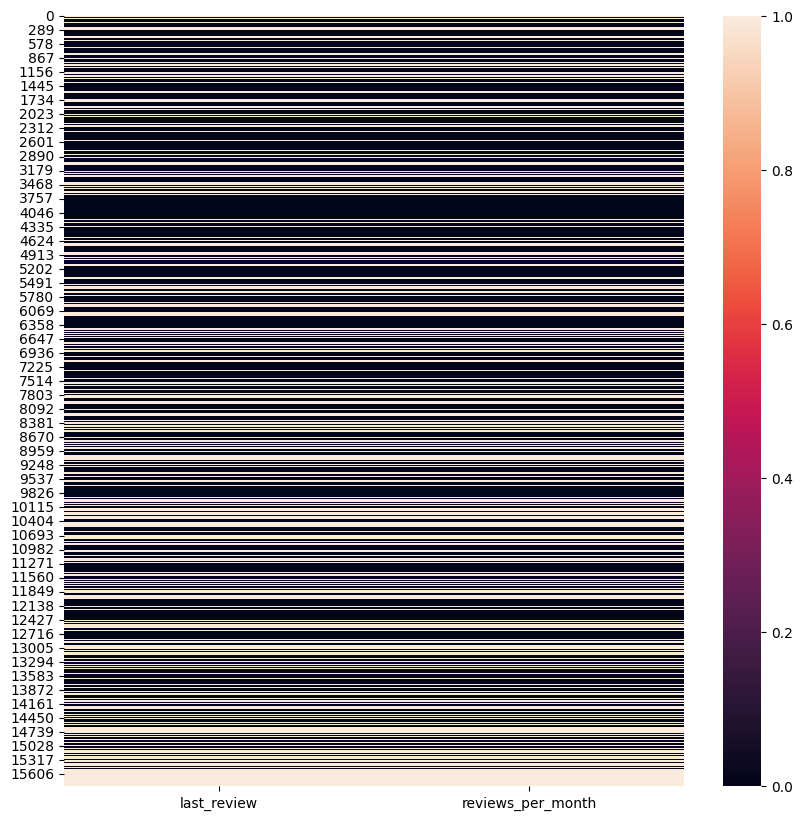

In [11]:
# Sebaran missing value di dalam data
plt.figure(figsize=(10,10))
sns.heatmap(df[['last_review','reviews_per_month']].isna())

Secara garis besar:
* *missing value* di kolom `last_review` dan `reviews_per_month` memiliki proporsi yang cukup tinggi (>10%), dengan missing value di kolom `last_review` dan `reviews_per_month` mencapai 32.52%.
* *missing value* di kolom `last_review` dan `reviews_per_month` memiliki sebaran yang terlihat berkaitan, jika data di `last_review` kosong, maka kemungkinan besar data di `reviews_per_month` juga kosong.  


Ada 2 cara untuk menangani *missing value*:
* pertama, menghapus baris/kolom yang berisi *missing value*. Cara ini tidak disarankan dalam kasus kita, karena jumlah missing value yang tergolong cukup tinggi (sampai 32%).
* kedua, mengisi data yang hilang. Cara ini lebih disarankan. Ada beberapa metode yang bisa digunakan untuk mengisi missing value, cara yang paling baik adalah dengan mengisi data yang hilang dengan nilai sebenarnya, atau sedekat mungkin dengan nilai asli. Dalam kasus ini, kita akan mencoba mengisi *missing value* berdasarkan kolom lain yang secara domain knowledge atau secara statistik berkaitan dengan kolom yang memiliki *missing value*. Jika masih ada kolom yang tidak bisa diisi, barulah kita mengisi dengan angka *mean, median* atau *modus*. Menghapus data akan menjadi opsi terakhir.

#### `name`
Ganti `name` dari listing tanpa nama menjadi 'no name'

In [12]:
df['name'] = df['name'].fillna('No Name')
df['name'].isna().sum()

0

#### `last_review` dan `reviews_per_month`

Dari analisis di atas, kita sudah tau bahwa *missing value* `last_review` dan `reviews_per_month` saling berkaitan. Maka, kita akan memutuskan cara pengisian kedua kolom ini secara bersamaan.  

In [13]:
df[['last_review', 'reviews_per_month']].isna().sum()

last_review          5790
reviews_per_month    5790
dtype: int64

Terdapat 5790 data kosong di kolom `last_review` dan 5790 di kolom `reviews_per_month`.
Pertama, kita akan coba melihat, apakah data-data kosong di kolom `last_review` dan `reviews_per_month` berasal dari listing yang memang belum mendapatkan review (dilihat dari kolom `number_of_reviews`)?

In [14]:
display(df[df['last_review'].isna()]['number_of_reviews'].value_counts(),
df[df['reviews_per_month'].isna()]['number_of_reviews'].value_counts())

number_of_reviews
0    5790
Name: count, dtype: int64

number_of_reviews
0    5790
Name: count, dtype: int64

Dari hasil di atas, kita dapat asumsikan bahwa listing yang nilai `last_review` dan `reviews_per_month` memiliki missing values memang belum mendapatkan review dari pengguna. Sehingga wajar saja 2 kolom tersebut tidak memiliki nilai.

Sekarang kita akan mengisi mssing value pada `last_review` dengan '1970-01-01' (karena kolom ini memiliki tipe data datetime, kita tidak bisa mengganti value-nya dengan 0). Sedangkan kolom `reviews_per_month` akan diisi dengan 0.

In [15]:
df.loc[(df['last_review'].isna()) & (df['reviews_per_month'].isna()) & (df['number_of_reviews'] == 0),['last_review', 'reviews_per_month']] = ['1970-01-01', 0]
df.head()

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,1970-01-01,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,1970-01-01,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,1970-01-01,0.00,3,365,0


### Anomalies

#### `last_review` Data Type

Karena tipe data `last_review` masih dalam bentuk object, kita harus mengganti tipe datanya ke dalam datetime

In [16]:
df['last_review'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 15854 entries, 0 to 15853
Series name: last_review
Non-Null Count  Dtype 
--------------  ----- 
15854 non-null  object
dtypes: object(1)
memory usage: 124.0+ KB


In [17]:
df['last_review'] = pd.to_datetime(df['last_review'], format='%Y-%m-%d')
df.head()

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,1970-01-01,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,1970-01-01,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,1970-01-01,0.00,3,365,0


In [18]:
df['last_review'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 15854 entries, 0 to 15853
Series name: last_review
Non-Null Count  Dtype         
--------------  -----         
15854 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 124.0 KB


#### `price` = 0

Selanjutnya kita akan mengatasi listing yang memiliki `price` = 0

In [19]:
df[df['price'] == 0]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,1970-01-01,0.0,1,0,0


Hanya ada satu listing yang memiliki `price` = 0. Listing tersebut berada di daerah 'Vadhana' dan bertipe kamar 'Hotel room'. Maka dari itu, agar tarif listingnya relevan, kita akan mengganti nilai `price` dari listing tersebut menjadi median `price` dari listing yang berada di daerah 'Vadhana' dan bertipe kamar 'Hotel room'.

In [20]:
df.loc[(df['district'] == 'Vadhana') & (df['room_type'] == 'Hotel room')]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
367,3772295,"*Kingsize Boutique Room* 10min to Skytrain, WiFi",19266319,Alex,Vadhana,13.730530,100.595910,Hotel room,859,1,35,2022-11-23,0.40,36,349,2
388,3813738,Private Kingsize bed 10mins to SkyTrain free BF,19266319,Alex,Vadhana,13.732560,100.595770,Hotel room,650,1,24,2017-07-10,0.26,36,349,0
1201,8410736,2 connecting rooms ( family room 4-5 pax),44305808,Lek Boonsiri,Vadhana,13.732250,100.596280,Hotel room,2386,1,7,2018-12-31,0.10,41,365,0
1385,9701091,Matchbox Bangkok Couple Sleep Dorm4,31446183,Matchbox Bangkok Hostel,Vadhana,13.733700,100.566910,Hotel room,565,1,3,2016-09-11,0.04,8,365,0
2136,13722609,Bourbon Street Boutique Hotel,80196677,Bourbon Street,Vadhana,13.740020,100.588870,Hotel room,1200,1,0,1970-01-01,0.00,3,89,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8528,37134868,Luxurious Room with Modern Bathtub close to BTS,186195358,The Continent Hotel Bangkok,Vadhana,13.736386,100.562057,Hotel room,7713,1,4,2022-04-16,0.11,5,362,2
8956,38336342,Triple room with bathtub & breakfast at Nana,378180502,Panitchaya,Vadhana,13.741640,100.557280,Hotel room,3363,1,0,1970-01-01,0.00,22,0,0
9039,38706931,Modern Thai Room - Sukhumvit Asok,98598351,Admiral Premier,Vadhana,13.738200,100.564640,Hotel room,6603,1,0,1970-01-01,0.00,17,358,0
9040,38707233,1BR Suite with Balcony for 3 Adults - Asok Station,98598351,Admiral Premier,Vadhana,13.738200,100.564640,Hotel room,4000,1,0,1970-01-01,0.00,17,363,0


In [21]:
df.loc[(df['district'] == 'Vadhana') & (df['room_type'] == 'Hotel room')]
median_price_Vadhana_hotel = df.loc[(df['district'] == 'Vadhana') & (df['room_type'] == 'Hotel room')].describe()['price']['50%']
print('Median `price` dari listing yang berada di \'Vadhana\' dan bertipe kamar \'Hotel room\':', median_price_Vadhana_hotel)

Median `price` dari listing yang berada di 'Vadhana' dan bertipe kamar 'Hotel room': 2414.0


In [22]:
df.loc[df['price'] == 0, 'price'] = median_price_Vadhana_hotel
df[df['id'] == 44563108]

,id,name,host_id,host_name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,2414,1,0,1970-01-01,0.0,1,0,0


### Dealing with Ambiguous Columns

#### Dropping irrelevant columns `id`, `host_id`, `host_name`, `availability_365`

In [23]:
df = df.drop(['id', 'host_id', 'host_name', 'availability_365'], axis = 1)
df

,name,district,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm
0,Nice room with superb city view,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,0
1,"Easy going landlord,easy place",Bang Na,13.668180,100.616740,Private room,1316,1,0,1970-01-01,0.00,2,0
2,modern-style apartment in Bangkok,Bang Kapi,13.752320,100.624020,Private room,800,60,0,1970-01-01,0.00,1,0
3,Spacious one bedroom at The Kris Condo Bldg. 3,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,1
4,Suite Room 3 at MetroPoint,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,1970-01-01,0.00,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...
15849,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,Pra Wet,13.715132,100.653458,Private room,2298,28,0,1970-01-01,0.00,1,0
15850,Euro LuxuryHotel PratunamMKt TripleBdNrShopingArea,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,1970-01-01,0.00,14,0
15851,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,1970-01-01,0.00,14,0
15852,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,1970-01-01,0.00,14,0


#### `number_of_reviews`, `reviews_per_month`, `number_of_reviews_ltm`

Kita perlu melihat persebaran `number_of_reviews`, `reviews_per_month`, dan `number_of_reviews_ltm`

In [24]:
display(df['number_of_reviews'].describe())
print('Banyaknya data dengan `number_of_reviews` = 0: ', len(df[df['number_of_reviews'] == 0]))

count    15854.000000
mean     16.654157   
std      40.613331   
min      0.000000    
25%      0.000000    
50%      2.000000    
75%      13.000000   
max      1224.000000 
Name: number_of_reviews, dtype: float64

Banyaknya data dengan `number_of_reviews` = 0:  5790


In [25]:
display(df['reviews_per_month'].describe())
print('Banyaknya data dengan `reviews_per_month` = 0: ', len(df[df['reviews_per_month'] == 0]))

count    15854.000000
mean     0.516178    
std      0.952753    
min      0.000000    
25%      0.000000    
50%      0.090000    
75%      0.670000    
max      19.130000   
Name: reviews_per_month, dtype: float64

Banyaknya data dengan `reviews_per_month` = 0:  5790


Menurut airbnb.com, hanya host dan tamu yang menyewa serta membayar sewa lewat airbnb saja yang dapat meninggalkan review. Karena data tersebut tidak punya riwayat jumlah booking yang *successful*, maka dari itu, kita dapat menggunakan `reviews_per_month` dan `number_of_reviews` sebagai acuan popularitas dan successful booking yang terjadi. Karena umumnya, sebelum seseorang menyewa sebuah listing, mereka membaca review dari listing tersebut terlebih dahulu. Jika banyak yang meninggalkan review baik, calon penyewa berpotensi menyewa listing tersebut. 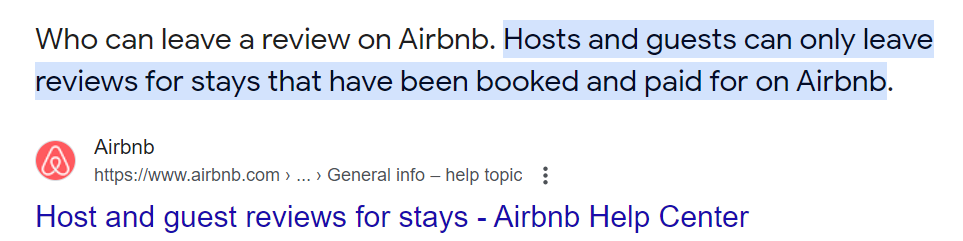

In [26]:
display(df['number_of_reviews_ltm'].describe())
print('Banyaknya data dengan `number_of_reviews_ltm` = 0: ', len(df[df['number_of_reviews_ltm'] == 0]))

count    15854.000000
mean     3.481519    
std      8.916937    
min      0.000000    
25%      0.000000    
50%      0.000000    
75%      3.000000    
max      325.000000  
Name: number_of_reviews_ltm, dtype: float64

Banyaknya data dengan `number_of_reviews_ltm` = 0:  9220


Terdapat 9220 baris yang belum mendapatkan review selama 12 bulan terakhir. `number_of_reviews_ltm` dapat digunakan untuk menganalisis listing populer akhir-akhir ini.

### Adding relevant features based on existing variables

#### `minimum_nights`

Buat fungsi untuk menetapkan 'short' pada kolom term untuk `minimum_nights` < 28 dan 'long' pada kolom term untuk `minimum_nights` >= 28. Setelah itu, kita akan menghapus kolom `minimum_nights`. Karena, mengubah nilai numerik menjadi kategori yang lebih deskriptif membuatnya lebih mudah untuk diinterpretasikan. Daripada harus mengingat nilai numerik yang berbeda-beda untuk menentukan apakah minimum_nights dianggap pendek atau panjang, kita dapat langsung melihat kategori yang diberikan.

In [27]:
def assign_term(min_nights):
    if min_nights < 28:
        return 'short'
    else:
        return 'long'

In [28]:
# Terapkan fungsi ke kolom 'minimum_nights' untuk membuat kolom 'term'
df['term'] = df['minimum_nights'].apply(assign_term)

# Hapus kolom minimum_nights
df = df.drop(['minimum_nights'], axis = 1)
df.head()

,name,district,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,term
0,Nice room with superb city view,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,65,2020-01-06,0.50,2,0,short
1,"Easy going landlord,easy place",Bang Na,13.66818,100.61674,Private room,1316,0,1970-01-01,0.00,2,0,short
2,modern-style apartment in Bangkok,Bang Kapi,13.75232,100.62402,Private room,800,0,1970-01-01,0.00,1,0,long
3,Spacious one bedroom at The Kris Condo Bldg. 3,Din Daeng,13.78823,100.57256,Private room,1286,2,2022-04-01,0.03,1,1,short
4,Suite Room 3 at MetroPoint,Bang Kapi,13.76872,100.63338,Private room,1905,0,1970-01-01,0.00,3,0,short


#### `reviews_per_month` as popularity

Seperti yang kita tahu, untuk dapat meninggalkan review, user harus sudah pernah menyewa dan membayar lewat Airbnb. Maka dari itu, kita dapat menggunakan `reviews_per_month` sebagai acuan populeritas dari sebuah listing.

In [29]:
# Definisikan fungsi untuk mengubah nilai 'popularity' berdasarkan nilai 'number_of_reviews'
def assign_popularity(num_reviews):
    if num_reviews > upper_bound:
        return 'popular'
    else:
        return 'unpopular'

In [30]:
# Hitung nilai IQR
Q1 = df['reviews_per_month'].quantile(0.25)
Q3 = df['reviews_per_month'].quantile(0.75)
IQR = Q3 - Q1

# Tentukan batas atas untuk outlier
upper_bound = Q3 + 1.5 * IQR
print('Upper bound =', upper_bound)
# Terapkan fungsi ke kolom 'number_of_reviews' untuk membuat kolom 'popularity'
df['popularity'] = df['reviews_per_month'].apply(assign_popularity)

Upper bound = 1.6750000000000003


Dengan fungsi tersebut, semua listing dengan `reviews_per_month` > upper_bound akan dikategorikan sebagai listing yang 'popular'. Sedangkan yang tidak akan dikategorikan sebagai listing 'unpopular'

#### `language` based on listings' `name`
Di sini, kita melihat apakah judul listing mengandung karakter/huruf latin atau tidak. Jika judul mengandung huruf selain huruf latin, kita kategorikan sebagai 'Not English'. Jika judul mengandung huruf latin saja, kita kategorikan sebagai 'English'.

In [31]:
def remove_emojis(text):
    return ''.join(c for c in text if (emoji.is_emoji(c) == False))

# Fungsi untuk menghapus emoji/simbol dalam judul listing
def remove_misc_symbols(text):
    emoji_pattern = re.compile(pattern="["
                                     u"\U0001F600-\U0001F64F"  # Emojis in the Miscellaneous Symbols and Faces range
                                     u"\U0001F300-\U0001F5FF"  # Emojis in the Miscellaneous Symbols range
                                     u"\U0001F680-\U0001F6FF"  # Emojis in the Transport and Map Symbols range
                                     u"\U0001F700-\U0001F77F"  # Emojis in the Alchemical Symbols range
                                     u"\u2600-\u26FF"  # Miscellaneous Symbols range
                                     u"\u2700-\u27BF"  # Dingbats and Miscellaneous Symbols range
                                     u"\u25A0-\u25FF" # Geometric Shapes range
                                     u"\u1D10-\u1D1F" # Musical Symbols range
                                     u"\u2460-\u24FF" # Enclosed Alphanumeric range
                                     "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

# Fungsi untuk mengecek apakah listing menggunakan huruf latin atau tidak
def contains_only_english_words(input_string):
    pattern = r'^[a-zA-Z0-9\s' + re.escape(string.punctuation) + ']+$'
    return re.match(pattern, input_string) is not None


# Buat kolom baru yang merupakan judul listing tanpa emoji
df['name_no_emoji'] = df['name'].apply(remove_emojis)
df['name_no_emoji'] = df['name_no_emoji'].apply(remove_misc_symbols)

# Dari kolom baru tersebut, emoji sudah dihapuskan. Sekarang, kita bisa menentukan apakah listing berbahasa Inggris atau tidak
df['language'] = df['name_no_emoji'].apply(contains_only_english_words)
df['language'] = np.where(df['language'], 'English', 'Not English')

# Hapus kolom 'name_no_emoji' karena kolom tersebut tidak akan kita pakai lagi
df = df.drop(['name_no_emoji'], axis = 1)
df

,name,district,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,term,popularity,language
0,Nice room with superb city view,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,65,2020-01-06,0.50,2,0,short,unpopular,English
1,"Easy going landlord,easy place",Bang Na,13.668180,100.616740,Private room,1316,0,1970-01-01,0.00,2,0,short,unpopular,English
2,modern-style apartment in Bangkok,Bang Kapi,13.752320,100.624020,Private room,800,0,1970-01-01,0.00,1,0,long,unpopular,English
3,Spacious one bedroom at The Kris Condo Bldg. 3,Din Daeng,13.788230,100.572560,Private room,1286,2,2022-04-01,0.03,1,1,short,unpopular,English
4,Suite Room 3 at MetroPoint,Bang Kapi,13.768720,100.633380,Private room,1905,0,1970-01-01,0.00,3,0,short,unpopular,English
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,Pra Wet,13.715132,100.653458,Private room,2298,0,1970-01-01,0.00,1,0,long,unpopular,Not English
15850,Euro LuxuryHotel PratunamMKt TripleBdNrShopingArea,Ratchathewi,13.753052,100.538738,Private room,1429,0,1970-01-01,0.00,14,0,short,unpopular,English
15851,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Ratchathewi,13.753169,100.538700,Private room,1214,0,1970-01-01,0.00,14,0,short,unpopular,English
15852,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,Ratchathewi,13.754789,100.538757,Private room,1214,0,1970-01-01,0.00,14,0,short,unpopular,English


### Removing duplicates

In [32]:
print('Jumlah data duplikat:', df.duplicated().sum())
df = df.drop_duplicates()
print('Duplikat berhasil dihapus')

Jumlah data duplikat: 8
Duplikat berhasil dihapus


## Cleaned Dataset


In [33]:
df_clean = df.copy()
df_clean.isna().sum()
print('Jumlah baris:', len(df))

Jumlah baris: 15846


In [34]:
listItem = []
for col in df_clean.columns :
    listItem.append([col, df_clean[col].dtype, df_clean[col].isna().sum(),
                    df_clean[col].nunique(), list(df_clean[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
print(df_clean.shape)
dfDesc

(15846, 14)


,dataFeatures,dataType,null,unique,uniqueSample
0,name,object,0,14795,"[1 Bed in Capsule 6 Beds Mixed Dorm near BTS, Thewet Hideaway, the White bedroom.]"
1,district,object,0,50,"[Ratchathewi, Lak Si]"
2,latitude,float64,0,9606,"[13.69946, 13.73667]"
3,longitude,float64,0,10224,"[100.51129, 100.62608901411296]"
4,room_type,object,0,4,"[Shared room, Private room]"
5,price,int64,0,3039,"[3181, 1885]"
6,number_of_reviews,int64,0,298,"[298, 55]"
7,last_review,datetime64[ns],0,1670,"[2018-11-25T00:00:00.000000000, 2020-06-15T00:00:00.000000000]"
8,reviews_per_month,float64,0,514,"[2.64, 0.43]"
9,calculated_host_listings_count,int64,0,50,"[17, 30]"


Sebelum dibersihkan, kita memiliki 16 kolom. Sekarang kita memiliki 13 kolom dengan jumlah baris 15846. Terdapat 5790+ baris data yang kita isi dengan nilai yang dirasa relevan. Terdapat 8 data duplikat yang kita telah hapus. Selain itu, kita juga menambahkan kolom baru yaitu `term` (berdasarkan `minimum_nights`), `popularity` (berdasarkan `reviews_per_month`), `language` (berdasarkan `name`).

# Data Analysis
Kita sudah melakukan tahap _data cleaning_. Sekarang, kita bisa mulai melakukan analisis untuk mencari jawaban dari pertanyaan pada bagian pernyataan masalah.

Analisis akan dilakukan dengan menjadikan variabel `price` dan `popularity` sebagai target. Harga listing secara langsung mempengaruhi profitabilitas bagi host Airbnb. Analisis harga memungkinkan host untuk menyesuaikan tarif mereka dengan cara yang memaksimalkan pendapatan mereka. Popularity atau popularitas listing memberikan indikasi seberapa diminatinya suatu listing oleh tamu Airbnb. Hal ini membantu host untuk memahami tingkat permintaan dan kepopuleran listing mereka. Tingkat popularitas juga bisa menjadi indikator kualitas dan kepuasan tamu terhadap listing tersebut. Listing yang populer mungkin memiliki ulasan yang baik dan memberikan pengalaman yang memuaskan kepada tamu.

Kita akan melihat bagaimana fitur/atribut dari sebuah listing memengaruhi tarif harian dan popularitas listing. Banyak faktor penentu dari tarif sewa sebuah listing, maka dari itu kita perlu berhati-hati dalam menganalisis tarif sewa.

## Histogram
Dengan menggunakan histogram, kita akan melihat persebaran data dari masing-masing fitur numerik dan menentukan metode apa yang cocok dalam menganalisis data.

In [35]:
df_num = df_clean.select_dtypes(include='number')

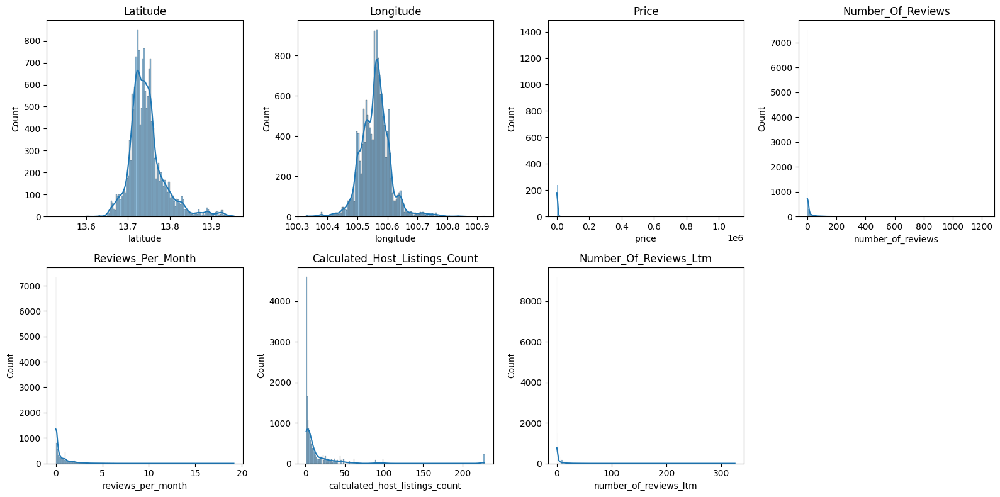

In [36]:
fig = plt.figure(figsize=(16,8)) # (horizontal, vertikal)
posisi = 1
plt.title('Histogram')
for kolom in df_num.columns:
  plt.subplot(2,4,posisi) # (berapa baris, berapa kolom, di urutan ke berapa)
  plt.title(f'{kolom.title()}')
  sns.histplot(df_num[kolom], kde = True) # kernell density estimator
  fig.tight_layout()

  posisi += 1

plt.show()

Dari histogram di atas, kita dapat simpulkan bahwa variabel **`price`, `number_of_reviews`, `reviews_per_month`, `calculated_host_listings_count`, dan `number_of_reviews_ltm` tidak berdistribusi normal, melainkan positively skewed distribution**. Artinya, modus < median < mean. Maka dari itu, kita akan menggunakan metode non-parametric untuk melakukan uji yang diperlukan. Selain itu, kita akan menggunakan nilai median untuk melakukan analisis.
Namun, untuk variabel `latitude` dan `longitude` perlu dilakukan testing lebih lanjut.

## Normality test with Shapiro-Wilk Test
Distribusi normal merupakan hal yang penting dalam sebuah analisis. Hal ini disebabkan oleh terdapat perbedaan metode analisis antara data yang berdistribusi normal dengan yang tidak. Apabila data tidak berdistribusi normal, kita perlu menggunakan metode statistik non-parametrik.

H0: Data berdistribusi normal

H1: Data tidak berdistribusi normal

Tingkat signifikansi (alpha) = 0.05

### `price`
Untuk memastikan distribusi dari variabel `price` kita akan menggunakan Shapiro-Wilk Test.

In [37]:
stat, pvalue = shapiro(df_num['price'])
print("p-value =", pvalue)

if pvalue < 0.05:
  print('Tolak H0')
  print('Tidak cukup bukti untuk menyatakan bahwa data tersebut berdistribusi normal')
else:
  print('Gagal tolak H0')
  print('Terdapat cukup bukti untuk menyatakan bahwa data berdistribusi normal')

p-value = 0.0
Tolak H0
Tidak cukup bukti untuk menyatakan bahwa data tersebut berdistribusi normal


Dengan menggunakan tingkat kepercayaan 5%, **hasil uji Shapiro-Wilk menyimpulkan bahwa data pada variabel `price` tidak berdistribusi normal, karena p-value < 0.05**. Maka ke depannya, kita akan menggunakan uji non-parametrik ketika ingin menganalisis variabel `price`.

### `latitude`

In [38]:
# Shapiro Wilk

stat, pvalue = shapiro(df_num['longitude'])
print("p-value: ", pvalue)

if pvalue < 0.05:
  print('Tolak H0')
  print('Tidak cukup bukti untuk menyatakan bahwa data tersebut berdistribusi normal')
else:
  print('Gagal tolak H0')
  print('Terdapat cukup bukti untuk menyatakan bahwa data berdistribusi normal')

p-value:  0.0
Tolak H0
Tidak cukup bukti untuk menyatakan bahwa data tersebut berdistribusi normal


Dengan menggunakan tingkat kepercayaan 5%, **hasil uji Shapiro-Wilk menyimpulkan bahwa data pada variabel `longitude` tidak berdistribusi normal, karena p-value < 0.05**.

### `latitude`

In [39]:
stat, pvalue = shapiro(df_num['latitude'])
print("p-value: ", pvalue)

if pvalue < 0.05:
  print('Tolak H0')
  print('Tidak cukup bukti untuk menyatakan bahwa data tersebut berdistribusi normal')
else:
  print('Gagal tolak H0')
  print('Terdapat cukup bukti untuk menyatakan bahwa data berdistribusi normal')

p-value:  0.0
Tolak H0
Tidak cukup bukti untuk menyatakan bahwa data tersebut berdistribusi normal


Dengan menggunakan tingkat kepercayaan 5%, **hasil uji Shapiro-Wilk menyimpulkan bahwa data pada variabel `latitude` tidak berdistribusi normal, karena p-value < 0.05**.

Namun, karena variabel `latitude` dan `longitude` hanyalah koordinat lokasi dari listing, kita tidak memerlukannya dalam analisis statistik. Kita hanya menggunakan kedua variabel ini untuk membuat peta pada folium.

## Outliers

Outliers merupakan nilai ekstrem yang dapat mengganggu analisis kita. Dengan threshold Z-score = 3, kita akan melihat ada berapa outlier yang dimiliki oleh masing-masing variabel dan mempertimbangkan langkah yang tepat untuk menanganinya.

In [40]:
df_num = df.select_dtypes(include='number')

In [41]:
for kolom in df_num.columns:
  std = df_num[kolom].std()
  mean = df_num[kolom].mean()

  z_scores = np.abs((df_num[kolom] - mean)/std)
  jumlah_outliers = len(z_scores[z_scores > 3])
  print(f'{kolom} memiliki outliers {jumlah_outliers}')


latitude memiliki outliers 353
longitude memiliki outliers 300
price memiliki outliers 45
number_of_reviews memiliki outliers 348
reviews_per_month memiliki outliers 297
calculated_host_listings_count memiliki outliers 228
number_of_reviews_ltm memiliki outliers 308


* Variabel `latitude` dan `longitude` adalah natural data points yang merepresentasikan koordinat lokasi listing. Maka kita akan mengabaikan outliers tersebut.
* Variabel`number_of_reviews` dan `calculated_host_listings_count` memiliki outlier yang cukup tinggi.
* Untuk outlier pada `number_of_reviews` dan `number_of_reviews_ltm` tidak akan kita hapus karena listing 'popular' akan menjadi bahan analisis kita.
* Outlier pada variabel `calculated_host_listings_count` akan kita biarkan karena suatu hotel dapat memiliki ratusan kamar dengan tipe yang berbeda-beda.
* Variabel `price` memiliki beberapa outlier. Outlier ini akan kita biarkan.

## Heatmap

Kita dapat dengan mudah memvisualisasikan korelasi antara variabel numerik dalam dataset dengan heatmap. Heatmap memberikan representasi visual yang jelas tentang seberapa kuat korelasi antara setiap pasangan variabel numerik.

Selain itu, heatmap juga memungkinkan kita untuk dengan cepat mengidentifikasi pola dan hubungan antara variabel numerik. Ini dapat membantu dalam mengidentifikasi variabel yang paling berpengaruh terhadap variabel target, seperti 'price' dalam kasus ini.

Karena data dari masing-masing variabel tidak berdistribusi normal, kita akan menggunakan metode Spearman Correlation.

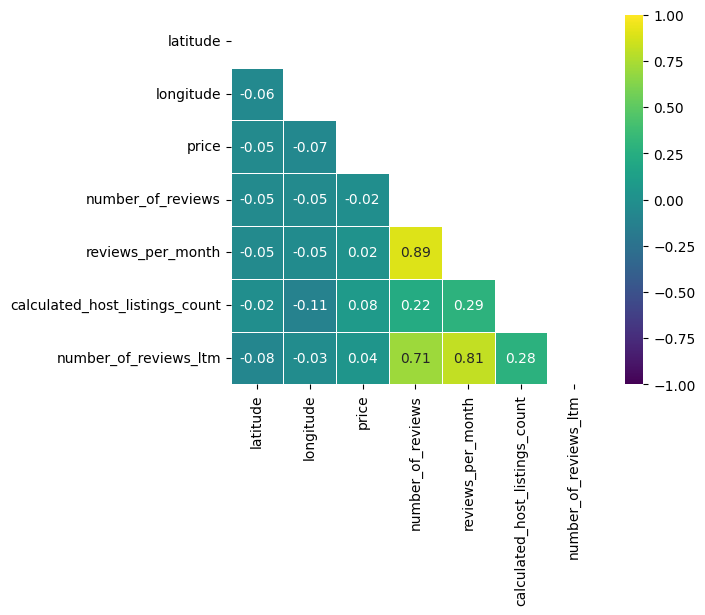

In [42]:
df_corr = df_num.corr(method = 'spearman')
mask = np.triu(np.ones_like(df_corr, dtype=bool))
sns.heatmap(df_corr, cmap = 'viridis', vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", square=True, linewidths=.5, mask = mask)
plt.show()

Dari hasil heatmap di atas, kita melihat ada beberapa hal penting:
* Terdapat korelasi positif yang lemah antara variabel `calculated_host_listings_count` dengan `number_of_reviews`. Artinya semakin listing yang dimiliki host, semakin banyak jumlah review yang didapat.
* Terdapat hubungan positif yang sangat kuat antara `reviews_per_month`, `number_of_reviews`, dan `number_of_reviews_ltm`. Karena, jika jumlah review keseluruhan tinggi, maka jumlah review bulanannya juga pasti tinggi.
* Terdapat korelasi positif yang lemah antara `reviews_per_month` dengan `calculated_host_listings_count`. Kita akan menganalisis kenapa hal ini terjadi.
* Korelasi antarvariabel lainnya tidak signifikan karena korelasinya sangat lemah.

## **`price` analysis**
Dalam menganalisis `price`, kita akan menggunakan median sebagai tolok ukur. Hal ini akan meminimalkan pengaruh outlier pada data terhadap hasil analisis. Dengan demikian, kita dapat memperoleh gambaran yang lebih konsisten dan tepat tentang distribusi harga sewa di setiap daerah tanpa terpengaruh oleh nilai ekstrem dalam data.

### **Analysis on `price` according to its `popularity` (Mann-Whitney U test)**
Tarif listing merupakan faktor penting yang mempengaruhi profitabilitas host Airbnb dan pihak Airbnb. Dengan mengetahui apakah ada perbedaan signifikan dalam tarif antara kamar yang populer dan tidak populer, host dapat menyesuaikan strategi harga mereka untuk meningkatkan profitabilitas.



In [43]:
popularity_count = df_clean['popularity'].value_counts().reset_index()
popularity_count.columns = ['popularity', 'count']
fig = px.pie(popularity_count, names='popularity', values='count', title='Popularity Distribution')
fig.show()

Mayoritas listing pada dataset ini dikategorikan sebagai 'unpopular'.


Karena `price` memiliki distribusi yang tidak normal, maka kita akan menggunakan Mann-Whitney U test untuk menguji apakah ada perbedaan signifikan antara tarif listing populer dan tidak populer.

Hipotesis:

H0: median1 = median2

H1: median1 > median2

Tingkat signifikansi (alpha) = 0.05

In [44]:
from scipy.stats import mannwhitneyu
t_score, pval = mannwhitneyu(df_clean[df_clean['popularity']=='popular']['price'],df_clean[df_clean['popularity']=='unpopular']['price'], alternative='greater')
print('p-value =', pval)
if pval/2 < 0.05:
  print("Tolak H0")
  print("Ada cukup bukti untuk menolak H0")
  print("Terdapat perbedaan signifikan antara median tarif kamar per hari listing popular dan median tarif kamar per hari listing unpopular")

else:
  print("Gagal tolak H0")
  print("Tidak ada cukup bukti untuk menolak H0")
  print("Tidak terdapat perbedaan signifikan antara median tarif kamar per hari listing popular dan median tarif kamar per hari listing unpopular")

p-value = 1.6268542655677834e-22
Tolak H0
Ada cukup bukti untuk menolak H0
Terdapat perbedaan signifikan antara median tarif kamar per hari listing popular dan median tarif kamar per hari listing unpopular


Berdasarkan hasil Mann-Whitney U test, dapat disimpulkan bahwa median tarif listing populer secara signifikan lebih tinggi dibandingkan dengan listing yang tidak populer. Temuan ini menunjukkan bahwa penyewa Airbnb di Bangkok, terutama turis, memprioritaskan kenyamanan dan bersedia memilih daftar dengan harga yang relatif lebih tinggi untuk pengalaman yang lebih nyaman dan memuaskan. Hasil uji Mann-Whitney U dapat memberikan petunjuk kepada host bahwa ada peluang untuk menyesuaikan harga listing mereka. Host dapat mempertimbangkan untuk menaikkan harga pada listing mereka yang populer untuk mencerminkan permintaan yang tinggi dari para pelanggan.

Untuk melihat perbedaannya dengan lebih jelas, kita akan menggunakan bar plot.

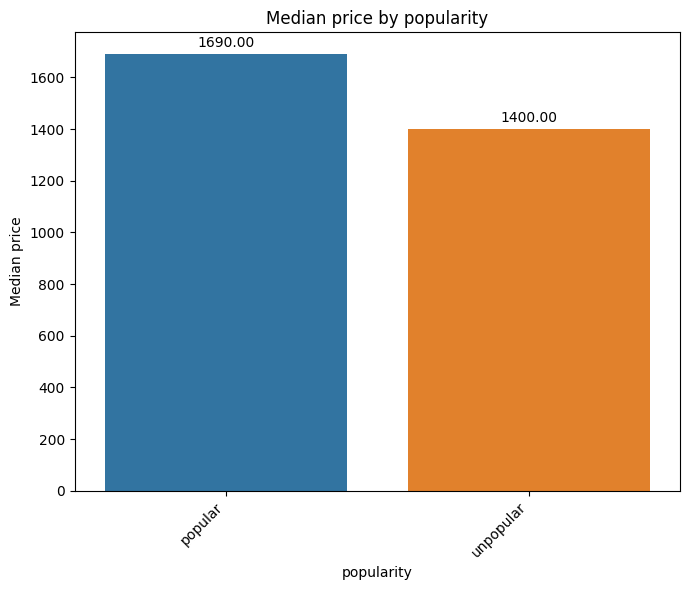

In [45]:
median_price_popular = df_clean.groupby('popularity')['price'].median().reset_index().sort_values(by = 'price', ascending=False)
plt.figure(figsize = (7,6))
ax = sns.barplot(data=median_price_popular.head(15), x='popularity', y='price', hue = 'popularity')
for container in ax.containers:
    ax.bar_label(container, fontsize=10, fmt='%.2f', padding=3)
plt.title('Median price by popularity')
plt.xlabel('popularity')
plt.ylabel('Median price')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Dari bar plot tersebut, kita dapat melihat bahwa terdapat perbedaan 290 THB antara kedua median tersebut. Perbedaan tersebut tergolong signifikan.

### **Analysis on `price` according to its `room_type` (Kruskal-Wallis Test)**

Analisis harga berdasarkan tipe kamar membantu host untuk memahami pasar secara lebih baik. Dengan mengetahui harga rata-rata untuk setiap tipe kamar, host dapat menyesuaikan harga mereka agar tetap kompetitif dan menarik bagi tamu.

In [46]:
room_type_count = df_clean['room_type'].value_counts().reset_index()
room_type_count.columns = ['room_type', 'count']
fig = px.pie(room_type_count, names='room_type', values='count', title='Room Type Distribution')
fig.show()

'Entire home/apt' merupakan tipe kamar yang paling banyak di antara tipe kamar lainnya dengan persentase 56.2%. Kemudian diikuti oleh 'Private room' dengan persentase 36.4%, 'Hotel room' dengan 4.1%, dan 3.29% untuk 'Shared room'.

Karena data pada variabel `price` tidak berdistribusi normal dan terdapat 4 kelompok, kita akan menggunakan Kruskal-Wallis test untuk melihat apakah terdapat perbedaan signifikan antara tarif harian dari masing-masing `room_type`.


Hipotesis:

H0: median1 = median2 = median3 = median4

H1: Setidaknya ada satu pasang room_type yang memiliki tarif per hari yang berbeda

Tingkat signifikansi (alpha) = 0.05

In [47]:
home = df_clean[df_clean['room_type'] == 'Entire home/apt']['price']
priv = df_clean[df_clean['room_type'] == 'Private room']['price']
hotel = df_clean[df_clean['room_type'] == 'Hotel room']['price']
share = df_clean[df_clean['room_type'] == 'Shared room']['price']

fscore, pval = kruskal(home, priv, hotel, share)
print('p-value = ', pval)
if pval < 0.05:
    print("Tolak H0")
    print('Setidaknya ada satu pasang room_type yang memiliki median tarif per hari yang berbeda')
else:
    print('Gagal tolak H0')
    print('Tidak ada perbedaan signifikan antara median tarif per hari dari entire home, private room, hotel room, dan shared room')

p-value =  4.4903256719921465e-257
Tolak H0
Setidaknya ada satu pasang room_type yang memiliki median tarif per hari yang berbeda


Dari uji Kruskal-Wallis, kita mengetahui bahwa setidaknya ada satu pasang room_type yang memiliki median tarif per hari yang berbeda, yang artinya terdapat hubungan antara `price` dan `room_type`.


Kita juga dapat membuat bar plot dari median `price` masing-masing room_type agar dapat mengobservasi perbedaannya

In [48]:
median_price_room = df_clean.groupby('room_type')['price'].median().reset_index().sort_values(by = 'price', ascending=False)

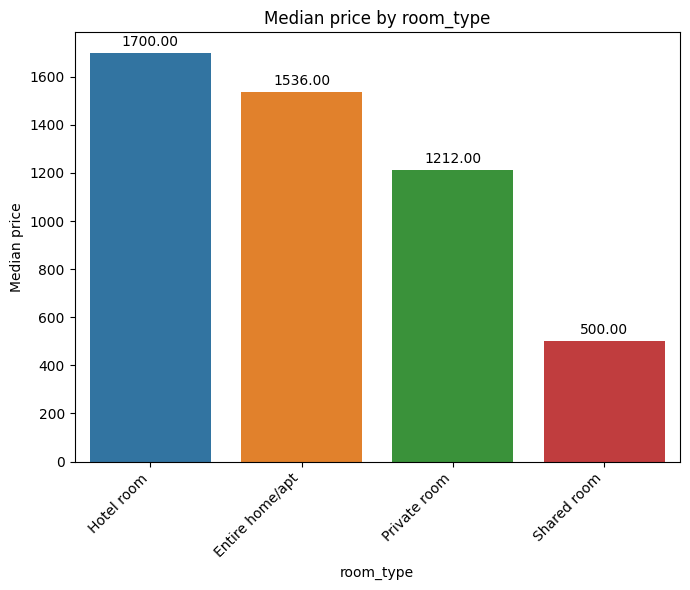

In [49]:
plt.figure(figsize = (7,6))
ax = sns.barplot(data=median_price_room, x='room_type', y='price', hue = 'room_type')
for container in ax.containers:
    ax.bar_label(container, fontsize=10, fmt='%.2f', padding=3)
plt.title('Median price by room_type')
plt.xlabel('room_type')
plt.ylabel('Median price')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Dari plot tersebut, kita dapat lihat bahwa median dari tarif masing-masing `room_type` berbeda satu sama lain. 'Hotel room' memiliki median tarif per hari yang paling tinggi, yaitu 1700 THB. Kemudian diikuti oleh 'Entire home/apt' dengan median tarif per hari 1536 THB, 'Private room' 1212 THB, dan yang paling rendah adalah 'Shared room' dengan median tarif per hari sebesar 500 THB.

Analisis ini memungkinkan host untuk memahami posisi mereka dalam pasar dan membandingkan tarif mereka dengan kompetitor yang memiliki tipe kamar yang sama. Hal ini membantu mereka untuk membuat keputusan strategis dalam menetapkan harga mereka agar tetap kompetitif tetapi juga menguntungkan.

### **Analysis on `price` according to its `district`**
Analisis tarif berdasarkan district membantu host untuk memahami permintaan pasar di setiap `district`. Dengan mengetahui bagaimana tarif bervariasi di berbagai daerah, host dapat menyesuaikan harga mereka untuk memaksimalkan profitabilitas sesuai dengan permintaan lokal. Informasi tentang tarif di setiap district juga memungkinkan host untuk menyesuaikan strategi harga mereka secara lebih efektif. Mereka dapat menetapkan harga yang lebih kompetitif di daerah dengan persaingan yang ketat atau harga yang lebih tinggi di daerah yang memiliki permintaan yang tinggi.

In [50]:
district_count = df_clean['district'].value_counts().reset_index().head(20)
district_count.columns = ['district', 'count']
fig = px.pie(district_count, names='district', values='count', title='Top 20 district Distribution')
fig.show()

Dari pie plot tersebut, kita dapat melihat bahwa `district` dengan listing paling banyak terletak di 'Vadhana', 'Khlong Toei', dan 'Huai Khwang'.

In [51]:
median_price_district = df_clean.groupby('district')['price'].median().reset_index()
mean_lat_lon_district = df_clean.groupby('district')[['latitude', 'longitude']].mean().reset_index()

# Merge the median price DataFrame with the mean latitude and longitude DataFrame
median_price_lln = pd.merge(median_price_district, mean_lat_lon_district, on='district').sort_values(by='price', ascending=False)
median_price_lln

,district,price,latitude,longitude
27,Nong Chok,2539.0,13.830064,100.848699
29,Parthum Wan,2400.0,13.742070,100.537411
47,Vadhana,2000.0,13.734648,100.574609
39,Samphanthawong,2000.0,13.736918,100.511237
8,Bang Rak,1850.0,13.726150,100.525398
34,Pom Prap Sattru Phai,1709.0,13.747014,100.511395
22,Khlong Toei,1700.0,13.723056,100.573001
37,Ratchathewi,1536.0,13.752983,100.543610
43,Taling Chan,1502.5,13.776295,100.437456
25,Lat Phrao,1500.0,13.820301,100.606542


Di sini, kita menggunakan data tambahan dari [Bangkok-districts.geojson](https://github.com/pcrete/gsvloader-demo/blob/master/geojson/Bangkok-districts.geojson) untuk menambahkan batas-batas dari tiap district di Bangkok.

In [52]:
bkk_geojson = 'Bangkok-districts.geojson'
bkk_location = [13.7563, 100.5018]

bkk_map = folium.Map(location = bkk_location, zoom_start = 11)

folium.Choropleth(
    geo_data = bkk_geojson,
    data = median_price_lln,
    columns = ['district','price'],
    key_on = 'feature.properties.dname_e',
    legend_name = 'Median Price'
).add_to(bkk_map)
for idx, row in median_price_lln.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"district: {row['district']}<br>Median Price: {row['price']}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(bkk_map)
bkk_map

Nong Chok memiliki harga yang paling tinggi meskipun terletak di pinggir kota Bangkok. Mari kita lihat kenapa

In [53]:
display(df_clean[df_clean['district'] == 'Nong Chok'])
print('Jumlah listing di Nong Chok =', len(df_clean[df_clean['district'] == 'Nong Chok']))

,name,district,latitude,longitude,room_type,price,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,number_of_reviews_ltm,term,popularity,language
48,Beautiful Wood Bangkok Resort House,Nong Chok,13.77900,100.83671,Entire home/apt,8658,0,1970-01-01,0.00,1,0,short,unpopular,English
190,Nostalgic Thai House - The Villa,Nong Chok,13.77672,100.83851,Entire home/apt,8658,1,2015-09-03,0.01,2,0,short,unpopular,English
192,Thai house overlooking pond & lotus,Nong Chok,13.77624,100.83931,Entire home/apt,3463,1,2016-03-10,0.01,2,0,short,unpopular,English
2419,Larena Villa & Resort,Nong Chok,13.83817,100.85322,Private room,955,0,1970-01-01,0.00,1,0,short,unpopular,English
4651,นำคุณที่ดีที่สุดของความฝัน,Nong Chok,13.85277,100.81527,Entire home/apt,3000,0,1970-01-01,0.00,1,0,short,unpopular,Not English
7635,CLOSE TO BANGKOK AIRPORT (SUVARNABHUMI),Nong Chok,13.85515,100.80646,Private room,2078,1,2019-09-11,0.02,1,0,short,unpopular,English
7831,Local life near svarnmbumi airport ; nature,Nong Chok,13.81448,100.83543,Private room,310,0,1970-01-01,0.00,1,0,short,unpopular,English
8072,Life @ Morning farm (Royal Exclusive),Nong Chok,13.80841,100.92328,Entire home/apt,4200,0,1970-01-01,0.00,2,0,short,unpopular,English
8099,LIFE @MorningFarm (Royal suite I),Nong Chok,13.81066,100.92344,Entire home/apt,3286,0,1970-01-01,0.00,2,0,short,unpopular,English
9218,Bann - Chang Homestay and Countryside pluralist,Nong Chok,13.87757,100.90546,Private room,1000,0,1970-01-01,0.00,1,0,short,unpopular,English


Jumlah listing di Nong Chok = 14


Hanya terdapat 14 listing yang berada di Nong Chok. Dapat kita lihat dari variable `name`, mayoritas listing yang disewakan merupakan villa dan resort yang memiliki tarif tinggi. Maka dari itu, median dari tarif listing di distrik Nong Chok paling tinggi dibandingkan distrik lainnya.

Dari visualisasi di atas, kita dapat melihat bahwa 'Nong Chok', 'Pathum Wan', dan 'Vadhana' merupakan 3 daerah yang memiliki tarif listing per hari yang paling tinggi. Sedangkan 3 daerah dengan tarif per hari paling murah adalah 'Nong Khaem', 'Don Mueang', dan 'Wang Thong Lang'. Selain itu, distrik yang berada di pusat kota, seperti 'Pathum Wan', 'Samphanthawong', 'Vadhana', 'Bang Rak', 'Pom Prap Sattru Phai', dan 'Khlong Toei' memiliki harga yang relatif tinggi dibandingkan wilayah lainnya.

`district` dengan tarif per hari paling tinggi:
* Distrik **Nong Chok** adalah salah satu distrik yang terletak di bagian timur laut Bangkok, Thailand. Distrik ini terkenal dengan suasana pedesaan yang tenang dan berbeda dari kesibukan perkotaan Bangkok. Nong Chok juga terkenal sebagai paru-paru kota Bangkok. Tarif per hari yang tinggi kemungkinan dipengaruhi oleh hal tersebut.
* Distrik **Pathum Wan** terletak di pusat kota Bangkok dan merupakan salah satu daerah yang paling terkenal dan dikunjungi di kota tersebut. Lokasi strategis ini membuatnya menjadi tempat yang diminati untuk tinggal, bekerja, dan berlibur. Keberadaan bisnis, pusat perbelanjaan, hotel mewah, restoran, dan tempat hiburan di sekitar distrik ini dapat meningkatkan harga properti.
* Distrik **Vadhana** terletak di pusat kota Bangkok dan sering dianggap sebagai salah satu daerah paling bergengsi dan paling diinginkan untuk tinggal di kota tersebut. Vadhana terletak di pusat bisnis dan perdagangan Bangkok. Distrik ini adalah rumah bagi banyak perkantoran, pusat perbelanjaan mewah, hotel bintang lima, dan pusat hiburan. Kehadiran bisnis dan pusat perdagangan mewah ini dapat meningkatkan harga properti di wilayah tersebut.

`district` dengan tarif per hari paling rendah:
* Dari peta tersebut, kita lihat bahwa distrik **Nong Khaem** terletak di pinggiran kota Bangkok dan relatif jauh dari pusat kota. Jarak yang lebih jauh dari pusat kota utama dapat mengakibatkan harga properti yang lebih rendah karena kurangnya aksesibilitas dan kenyamanan yang ditawarkan oleh lokasi yang lebih terpencil. Dibandingkan dengan distrik yang lebih terkenal, Nong Khaem kekurangan akses ke fasilitas umum seperti pusat perbelanjaan, restoran, dan hiburan dapat mempengaruhi daya tarik wilayah tersebut dan membuat harga properti menjadi lebih rendah. Selain itu, sedikitnya jumlah listing di distrik ini dapat dijadikan alasan mengapa median `price` di Nong Khaem sangat kecil (9 listing).
* Distrik **Wang Thong Lang** terletak di pinggiran kota dan relatif jauh dari pusat kota utama Bangkok. Jarak yang lebih jauh dari pusat kota dapat mengakibatkan harga properti yang lebih rendah karena kurangnya aksesibilitas dan kenyamanan yang ditawarkan oleh lokasi yang lebih terpencil.
* Distrik **Don Mueang** terletak di pinggiran kota dan relatif jauh dari pusat kota utama Bangkok. Jarak yang lebih jauh dari pusat kota dapat mengakibatkan harga properti yang lebih rendah karena kurangnya aksesibilitas dan kenyamanan yang ditawarkan oleh lokasi yang lebih terpencil. Meskipun terdapat Bandara Internasional Don Mueang di distrik ini, aksesibilitas transportasi ke pusat kota Bangkok tidak sebaik daerah-daerah lain yang memiliki akses ke sistem transportasi massal seperti BTS dan MRT. Selain itu, sedikitnya jumlah listing di distrik ini dapat dijadikan alasan mengapa median `price` di Don Mueang sangat kecil (10 listing).

Dari hasil analisis tersebut, host Airbnb dapat menyesuaikan strategi harga mereka berdasarkan informasi tentang tarif per hari tertinggi dan terendah di setiap district. Mereka dapat menetapkan harga yang lebih kompetitif di district dengan tarif per hari rendah untuk meningkatkan daya tarik dan okupansi, sementara di district dengan tarif per hari tinggi, mereka dapat menetapkan harga yang lebih tinggi untuk memaksimalkan profitabilitas.

### **Analysis on `price` according to its term (Mann-Whitney U Test)**

Analisis harga berdasarkan durasi tinggal membantu host untuk memahami preferensi dan perilaku pasar terkait dengan lama huni tamu. Dengan mengetahui bagaimana harga berbeda antara jangka panjang dan jangka pendek, host dapat menyesuaikan strategi harga mereka sesuai dengan permintaan dan kebutuhan pasar.

Kita akan menggunakan histogram untuk membandingkan *density* dsitribusi price berdasarkan `term`. Di sini kita akan memisahkan antara listing dengan `price`  < 10000 dan listing dengan `price` >= 10000 agar visualisasi tampak lebih jelas.

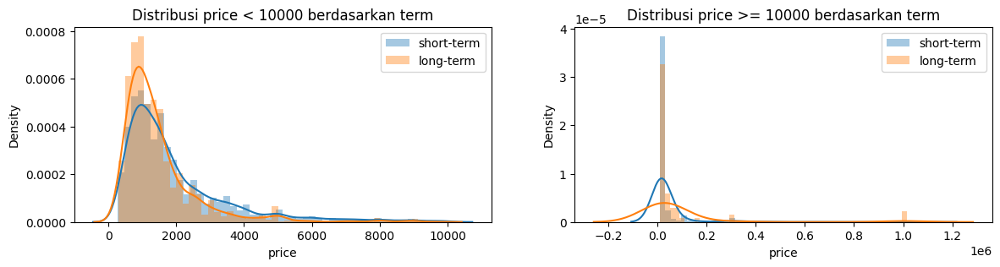

In [54]:
filter_df_10000 = df_clean[df_clean['price'] < 10000]
filter_df_above_10000 = df_clean[df_clean['price'] >= 10000]

filter_df = [filter_df_10000, filter_df_above_10000]
posisi = 1
plt.figure(figsize = (14,3))
for dataframe in filter_df:
  plt.subplot(1,2,posisi)
  sns.distplot(dataframe[dataframe['term']=='short']['price'], label='short-term')
  sns.distplot(dataframe[dataframe['term']=='long']['price'], label='long-term')
  if posisi == 1:
    plt.title('Distribusi price < 10000 berdasarkan term')
  else:
    plt.title('Distribusi price >= 10000 berdasarkan term')
  plt.legend()
  posisi += 1
plt.show()

Dari grafik di atas (`price` < 10000), kita lihat bahwa antara long-term dan short-term memiliki bentuk distribusi yang mirip. Modus price berada di kisaran 1000 THB. Kemudian untuk (`price` >= 10000), distribusi `price` untuk long-term lebih melebar, namun memiliki modus yang sama dengan short-term, yakni di angka 10000 THB.

Karena `price` tidak berdistribusi normal, selanjutnya kita akan melakukan analisis dengan one-tailed Mann-Whitney U test untuk menguji apakah ada perbedaan signifikan antara tarif sewa short-term dan long-term.

Hipotesis:

H0: median1 = median2

H1: median1 > median2

Tingkat signifikansi (alpha) = 0.05

In [55]:
from scipy.stats import mannwhitneyu
t_score, pval = mannwhitneyu(df_clean[df_clean['term']=='short']['price'],df_clean[df_clean['term']=='long']['price'], alternative='greater')
print('p-value =', pval/2)
if pval/2 < 0.05:
  print("Tolak H0")
  print("Ada cukup bukti untuk menolak H0")
  print('Terdapat cukup bukti untuk menyatakan bahwa listing dengan penyewaan short-term memiliki tarif sewa per hari yang lebih tinggi dibandingkan listing dengan sistem penyewaan long-term')

else:
  print("Gagal tolak H0")
  print("Tidak ada cukup bukti untuk menolak H0")
  print('Tidak ada cukup bukti untuk menyatakan bahwa listing dengan penyewaan short-term memiliki tarif sewa per hari yang lebih tinggi dibandingkan listing dengan sistem penyewaan long-term')


p-value = 5.169742764170962e-53
Tolak H0
Ada cukup bukti untuk menolak H0
Terdapat cukup bukti untuk menyatakan bahwa listing dengan penyewaan short-term memiliki tarif sewa per hari yang lebih tinggi dibandingkan listing dengan sistem penyewaan long-term


Dari hasil tersebut, kita simpulkan bahwa `term` dari listing memengaruhi variabel `price`.

Untuk melihat perbedaannya dengan lebih jelas, kita akan memvisualisasikannya dengan bar plot.

In [56]:
median_price_term = df_clean.groupby('term')['price'].median().reset_index().sort_values(by = 'price', ascending=False)

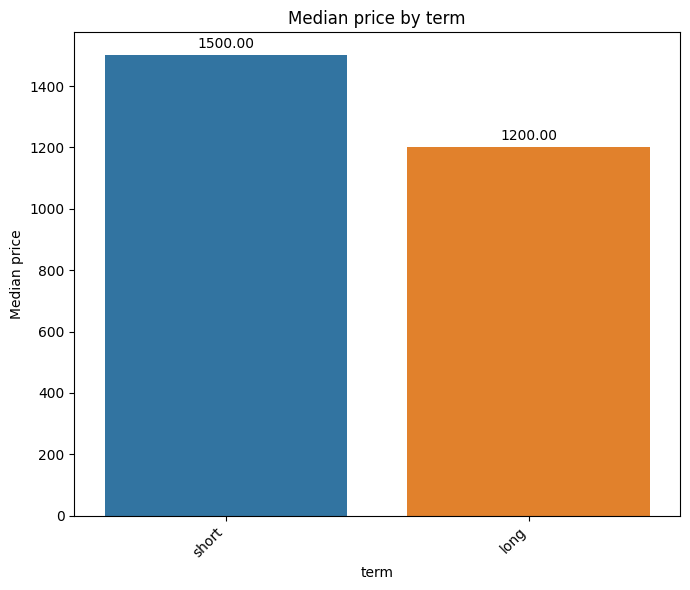

In [57]:
plt.figure(figsize = (7,6))
ax = sns.barplot(data=median_price_term, x='term', y='price', hue = 'term')
for container in ax.containers:
    ax.bar_label(container, fontsize=10, fmt='%.2f', padding=3)
plt.title('Median price by term')
plt.xlabel('term')
plt.ylabel('Median price')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Informasi di atas yang diperoleh dari uji Mann-Whitney tersebut memungkinkan host untuk menyesuaikan strategi harga mereka secara lebih efektif. Mereka dapat menetapkan harga yang lebih kompetitif untuk jangka panjang untuk menarik tamu yang mencari akomodasi jangka panjang, sementara untuk jangka pendek, mereka dapat menetapkan harga yang lebih tinggi untuk memaksimalkan pendapatan per hari.

## **`popularity` analysis**
Karena variabel `popularity` bersifat kategorik, kita akan menggunakan proportion Z test dan Chi-squared test untuk menguji hipotesis kita.

### **Analysis on `popularity` according to its `room_type` (Chi-squared Test)**
Dengan analisis ini kita akan mengetahui apakah 'room_type' memengaruhi `popularity` sebuah listing. Analisis ini dapat memberikan wawasan yang berharga bagi host Airbnb untuk memahami preferensi tamu dan mengoptimalkan strategi pemasaran mereka.


In [58]:
fig=px.sunburst(df_clean,path=['popularity','room_type'],color='popularity', title=f'Proporsi popularity Berdasarkan room_type')
fig.show()

Dari sunburst chart tersebut, kita ketahui bahwa 'Entire home/apt' dan 'Private room' mendominasi kategori listing populer. Namun, karena jumlah listing populer jauh lebih kecil, kita akan menggunakan uji statistik untuk mendalaminya lebih lanjut dengan uji Chi-squared.

H0: Proporsi antara 'Entire home/apt', 'Private room', 'Hotel room', dan 'Shared room' dengan label 'popular' sama besar (tidak ada hubungan antara `room_type` dengan `popularity)

H1: Setidaknya ada satu pasang proporsi yang berbeda (ada hubungan antara `room_type` dengan `popularity)

Tingkat signifikansi (alpha) = 0.05

In [59]:
cross_tab = pd.crosstab(df_clean['room_type'], df_clean['popularity'])
cross_tab

popularity,popular,unpopular
room_type,,
Entire home/apt,1179,7728
Hotel room,31,618
Private room,257,5511
Shared room,4,518


In [60]:
p_val = chi2_contingency(cross_tab)[1]
print('p-value =', p_val)
if pval > 0.05:
  print('Gagal tolak H0')
  print('Tidak ada hubungan antara kedua variabel')
else:
  print('Tolak H0')
  print('Tipe kamar memengaruhi popularitas')

p-value = 2.9661067713894067e-83
Tolak H0
Tipe kamar memengaruhi popularitas


In [61]:
len(df_clean[df_clean['popularity'] == 'popular'])

1471

Dari uji Chi-squared, disimpulkan bahwa ada perbedaan signifikan antara proporsi ke-4 `room_type` berdasarkan popularitas. Berarti, dapat kita simpulkan bahwa `room_type` memengaruhi `popularity.

Untuk dapat mengetahui pasangan mana yang berbeda, kita harus melakukan post-hoc test. Namun, demi kepentingan analisis ini, kita hanya cukup mengetahui apakah kedua variabel tersebut saling independen atau dependen.

### **Analysis on `popularity` based on its `term` (Proportion Z-test)**
Dengan memahami popularitas berdasarkan durasi tinggal, host Airbnb dapat lebih memahami preferensi tamu untuk tinggal jangka panjang atau jangka pendek. Informasi ini dapat membantu mereka menyesuaikan penawaran dan strategi pemasaran untuk menarik lebih banyak tamu dan meningkatkan okupansi.

Untuk mendapatkan gambaran mengenai proporsi masing-masing term berdasarkan dekomposisi popularitasnya, kita akan menggunakan sunburst chart.

In [62]:
fig=px.sunburst(df_clean,path=['popularity','term'],color='term', title=f'Proporsi popularity Berdasarkan term')
fig.show()

Dari plot di atas, kita dapat ketahui bahwa listing populer mayoritas merupakan short-term stay. Namun, karena terdapat ketidaksimbangan kelas antara short-term dan long-term stay, kita harus mengujinya secara lebih lanjut. Hipotesis saya, karena Bangkok merupakan kota wisata, listing yang lebih populer adalah listing short-term. Hal ini sejalan dengan data yang diperoleh dari statista.com. Menurut publikasi tersebut, turis mancanegara rata-rata singgah di sebuah hotel selama 9-18 hari (masuk ke kategori short-term stay, kurang dari 28 hari. [(source)](https://www.statista.com/statistics/1154981/thailand-length-of-stay-of-hotel-guests-by-region-of-origin/)

Di sini kita akan menggunakan proportion Z-test two independent sample.
* Pertama kita akan menguji apakah proporsi untuk long-term dan popular listing sama dengan proporsi short-term dan popular listing.
* Kedua kita akan menguji apakah proporsi untuk short-term dan unpopular listing sama dengan proporsi long-term dan unpopular listing.

#### long-term popular vs short-term popular

H0: Tidak ada perbedaan signifikan antara proporsi long-term popular listing dan short-term popular listing

H1: Terdapat perbedaan signifikan antara proporsi long-term popular listing dan short-term popular listing

Tingkat signifikansi (alpha) = 0.05

In [63]:
long_pop = len(df_clean[(df_clean['term']=='long') & (df_clean['popularity']=='popular')])
total_long = len(df_clean[df_clean['term']=='long'])
p_long_pop = long_pop/total_long
print('Proporsi long-term dan popular = ',p_long_pop)

Proporsi long-term dan popular =  0.028139289482940557


In [64]:
short_pop = len(df_clean[(df_clean['term']=='short') & (df_clean['popularity']=='popular')])
total_short = len(df_clean[df_clean['term']=='short'])
p_short_pop = short_pop/total_short
print('Proporsi short-term dan popular = ', p_short_pop)

Proporsi short-term dan popular =  0.10697531338921787


In [65]:
zscore, pval = proportions_ztest(
                [p_long_pop,p_short_pop], # proporsi nya
                [total_long, total_short]) # total
print('p-value =',pval)
if pval > 0.05:
  print('Gagal tolak H0')
  print('Tidak ada perbedaan signifikan antara proporsi long-term popular dan short-term popular listing')
else:
  print('Tolak H0')
  print('Terdapat perbedaan signifikan antara proporsi short-term popular dan long-term popular listing')

p-value = 0.9779523015949793
Gagal tolak H0
Tidak ada perbedaan signifikan antara proporsi long-term popular dan short-term popular listing


In [66]:
print('Jumlah listing yang popular =', total_long)

Jumlah listing yang popular = 2843


Dari uji proportion Z-test two independent sample, disimpulkan bahwa tidak ada perbedaan signifikan antara proporsi long-term popular listing dan short-term popular listing. Meskipun proporsi long-term dan popular dari data tersebut adalah 2.814% sedangkan short-term dan popular adalah 10.6975%, kita tetap gagal menolak H0. Hal ini disebabkan oleh jumlah listing popular yang sangat sedikit, yaitu 2843 dari 15801 jumlah data. Akibatnya, perbedaan dalam proporsi mungkin tidak cukup besar untuk dapat terdeteksi sebagai perbedaan yang signifikan secara statistik.

#### long-term unpopular vs short-term unpopular

H0: Tidak ada perbedaan signifikan antara proporsi long-term unpopular listing dan short-term unpopular listing

H1: Terdapat perbedaan signifikan antara proporsi long-term unpopular listing dan short-term unpopular listing

Tingkat signifikansi (alpha) = 0.05


In [67]:
long_unpop = len(df_clean[(df_clean['term']=='long') & (df_clean['popularity']=='unpopular')])
total_long = len(df_clean[df_clean['term']=='long'])
p_long_unpop = long_unpop/total_long
print('Proporsi long-term dan unpopular = ',p_long_unpop)

Proporsi long-term dan unpopular =  0.9718607105170595


In [68]:
short_unpop = len(df_clean[(df_clean['term']=='short') & (df_clean['popularity']=='unpopular')])
total_short = len(df_clean[df_clean['term']=='short'])
p_short_unpop = short_unpop/total_short
print('Proporsi short-term dan unpopular = ', p_short_unpop)

Proporsi short-term dan unpopular =  0.8930246866107822


In [69]:
zscore, pval = proportions_ztest(
                [p_long_unpop,p_short_unpop], # proporsi nya
                [total_long, total_short], alternative='larger') # total
print('p-value =',pval/2)
if pval/2 > 0.05:
  print('Gagal tolak H0')
  print('Tidak ada perbedaan signifikan antara proporsi long-term unpopular listing dan short-term unpopular listing')
else:
  print('Tolak H0')
  print('Terdapat perbedaan signifikan antara proporsi long-term unpopular listing dan short-term unpopular listing')

p-value = 0.05596924762193822
Gagal tolak H0
Tidak ada perbedaan signifikan antara proporsi long-term unpopular listing dan short-term unpopular listing


Dari uji proportion Z-test two independent sample, disimpulkan bahwa tidak ada perbedaan signifikan antara proporsi long-term unpopular listing dan short-term unpopular listing. Berarti, `term` tidak memengaruhi `popularity` dari sebuah listing.

Meskipun demikian, kesimpulan ini menyoroti pentingnya pengelolaan kualitas dan layanan dalam meningkatkan popularitas listing. Hal ini menekankan bahwa host Airbnb harus terus berupaya untuk menyediakan pengalaman yang baik kepada tamu mereka, terlepas dari durasi tinggal.

### **Analysis on `popularity` based on its `district`**
Dengan menganalisis popularitas berdasarkan district, host dapat memahami permintaan pasar di berbagai lingkungan. Mereka dapat mengidentifikasi lingkungan yang paling diminati oleh tamu, serta faktor-faktor apa yang membuatnya menarik bagi tamu.

Dengan folium, kita dapat melihat preferensi penyewa dalam memilih listing berdasarkan daerahnya. Namun, di sini kita hanya akan menganalisis listing yang populer saja.

In [70]:
# Load the geojson file for Bangkok districts
bkk_geojson = 'Bangkok-districts.geojson'

# Create a map centered around Bangkok
bangkok_map = folium.Map(location=[13.7563, 100.5018], zoom_start=10)

# Add GeoJSON boundaries of Bangkok districts
folium.GeoJson(
    bkk_geojson,
    name='geojson',
    style_function=lambda feature: {
        'fillColor': 'transparent',
        'color': 'blue',
        'weight': 1,
        'fillOpacity': 0
    },
    tooltip=folium.GeoJsonTooltip(fields=['dname_e'], aliases=['District'])
).add_to(bangkok_map)

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Determine marker color based on popularity
    if row['popularity'] == 'popular':
        fill_color = 'green'
        folium.Circle(
        location=[row['latitude'], row['longitude']],
        radius=100,  # Adjust the radius as needed
        color=fill_color,  # Border color
        fill=True,
        fill_color=fill_color,
        fill_opacity=0.6
    ).add_to(bangkok_map)

# Show the map
bangkok_map


Dari map tersebut, kita dapat ketahui bahwa:
* Listing yang populer mayoritas terletak di pusat kota, khususnya di distrik Khloeng Toei, Vadhana, Sathon, Bang Rak, Ratchathewi, Pathum Wan, dan Phaya Thai. Distrik-distrik tersebut memang terkenal dengan *night market*, *night club*, mall mewah, bar, dan hiburan lainnya.
* Selain di pusat kota, listing populer juga ditemukan di sekitar bandara Internasional Don Mueang (distrik Don Mueang) dan bandara Suvarnabhumi (distrik Bang Phli yang terletak di luar Bangkok).


Kecenderungan popularitas berdasarkan `district` dapat memberikan pandangan tentang permintaan yang lebih tinggi atau lebih rendah di wilayah tertentu. Dengan memahami dinamika ini, host Airbnb dapat menyesuaikan harga mereka secara lebih akurat. Mereka dapat menetapkan harga yang lebih tinggi di kecamatan dengan popularitas tinggi, sementara mungkin menawarkan harga yang lebih kompetitif di daerah-daerah yang kurang diminati. Hal ini dapat membantu meningkatkan pendapatan dengan memaksimalkan margin keuntungan.



### **Analysis on `popularity` based on `calculated_host_listings_count` (Mann-Whitney U Test)**
Pada heatmap, kita melihat adanya korelasi lemah antara `calculated_host_listings_count` dengan `number_of_reviews` dan `reviews_per_month`. Sekarang kita akan membuktikan apakah listing populer cenderung dimiliki oleh host dengan listing yang banyak.

H0: Terdapat cukup bukti untuk menyatakan bahwa listing popular cenderung dimiliki oleh host dengan listing yang lebih banyak

H1: Tidak ada cukup bukti untuk menyatakan bahwa listing popular cenderung dimiliki oleh host dengan listing yang lebih banyak

Tingkat signifikansi (alpha) = 0.05

In [71]:
from scipy.stats import mannwhitneyu
t_score, pval = mannwhitneyu(df_clean[df_clean['popularity']=='popular']['calculated_host_listings_count'],df_clean[df_clean['popularity']=='unpopular']['calculated_host_listings_count'], alternative='greater')
print('p-value =', pval/2)
if pval/2 < 0.05:
  print("Tolak H0")
  print("Ada cukup bukti untuk menolak H0")
  print('Terdapat cukup bukti untuk menyatakan bahwa listing popular cenderung dimiliki oleh host dengan listing yang lebih banyak')

else:
  print("Gagal tolak H0")
  print("Tidak ada cukup bukti untuk menolak H0")
  print('Tidak ada cukup bukti untuk menyatakan bahwa listing popular cenderung dimiliki oleh host dengan listing yang lebih banyak')

p-value = 7.64738025735239e-98
Tolak H0
Ada cukup bukti untuk menolak H0
Terdapat cukup bukti untuk menyatakan bahwa listing popular cenderung dimiliki oleh host dengan listing yang lebih banyak


Untuk melihat perbedaannya dengan lebih jelas, mari kita visualisasikan.

In [72]:
median_popularity_list_count = df_clean.groupby('popularity')['calculated_host_listings_count'].median().reset_index().sort_values(by = 'calculated_host_listings_count', ascending=False)

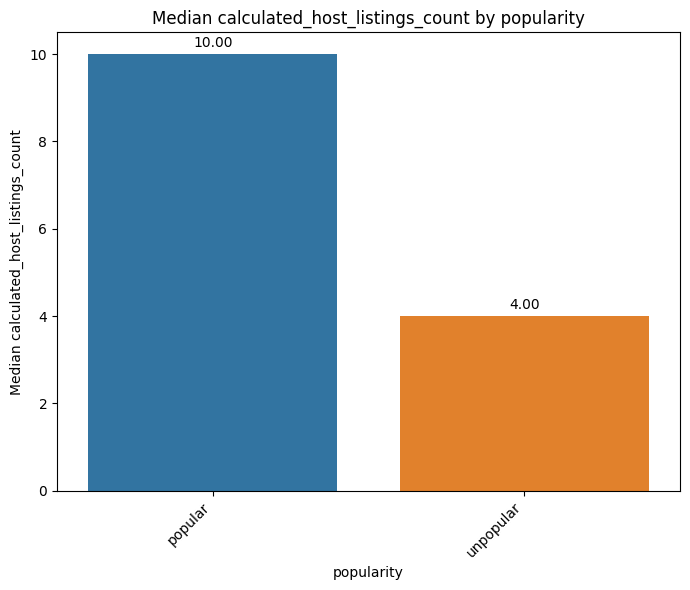

In [73]:
plt.figure(figsize = (7,6))
ax = sns.barplot(data=median_popularity_list_count, x='popularity', y='calculated_host_listings_count', hue = 'popularity')
for container in ax.containers:
    ax.bar_label(container, fontsize=10, fmt='%.2f', padding=3)
plt.title('Median calculated_host_listings_count by popularity')
plt.xlabel('popularity')
plt.ylabel('Median calculated_host_listings_count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Dari hasil uji Mann-Whitney, kita dapat simpulkan bahwa listing populer cenderung dimiliki oleh host dengan listing yang banyak. Hal ini mungkin menunjukkan bahwa host yang memiliki banyak listing memiliki kesempatan lebih besar untuk bereksperimen dengan harga, fasilitas, dan strategi pemasaran yang berbeda. Pengalaman ini memungkinkan mereka untuk mengoptimalkan listing berdasarkan feedback dan data kinerja, yang pada akhirnya meningkatkan popularitas dan kepuasan tamu.

## **listings' language analysis**
Judul dari sebuah listing adalah hal yang esensial karena judul menentukan daya tarik dari sebuah listing. Sekarang kita akan melihat judul seperti apa yang dipasang oleh host.

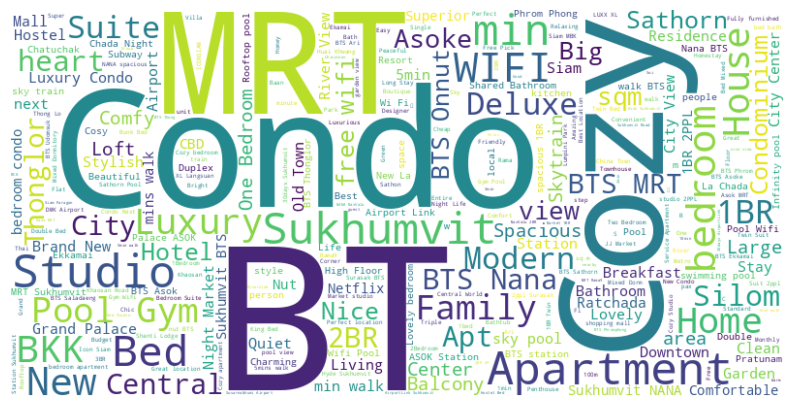

In [74]:
# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(['Bangkok', 'now', 'near', 'close', 'Place', 'Room', 'Private', 'BR', 'rent'])

# Concatenate all names into a single string
text = ' '.join(df['name'].astype(str))

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords = stopwords, max_words = 300).generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Dari word cloud tersebut, kita lihat bahwa kebanyakan host menambahkan beberapa hal ini pada judul listing mereka:
* Jenis kamar yang ditawarkan ('House', 'Studio', 'Condo', 'Apartment')
* MRT (Mass Rapid Transportation)
* BTS (Bangkok Mass Transit System)
* Berbagai fasilitas yang ditawarkan oleh listing (bed, wifi, netflix, garden, gym, balcony, bathtub)
* Wilayah listing (Sukhumvit, Sathorn, Thonglor)
* Tempat strategis di dekat listing (Night market, airport, stasiun BTS terdekat, mall, Skytrain)
* '5min', 'near' (menggambarkan jarak listing dengan daerah strategis)
* Berbagai kata sifat yang bersifat "menjual" (cozy, luxury, spacious, lovely)

Hasil dari word cloud tersebut dapat menginspirasi host untuk memasang judul listing yang lebih menarik, seperti menambahkan nama fasilitas yang ditawarkan, yang mungkin termasuk 'free wifi', 'Pool', 'pemandangan kota', 'Gym' sehingga secara langsung menyampaikan aspek-aspek menarik dari properti tersebut. Demikian pula, dengan menekankan lokasi strategis—misalnya, 'dekat pusat kota', 'beberapa langkah dari BTS/MRT', atau 'berselang beberapa menit dari Skytrain'—host dapat menangkap perhatian pelancong yang mencari kemudahan akses selama mereka menginap.


#### **Analysis on `popularity` and `number_of_reviews` based on listings' `language` (Mann-Whitney U Test)**

Selanjutnya kita akan menganalisis apakah listing dengan bahasa Inggris lebih populer dibandingkan listing berbahasa lainnya. Host dapat menarik audiens yang lebih luas dengan menyesuaikan bahasa listing mereka berdasarkan preferensi pelancong di platform Airbnb, khususnya jika terbukti bahwa listing dengan judul dalam bahasa tertentu lebih populer atau menerima lebih banyak ulasan.

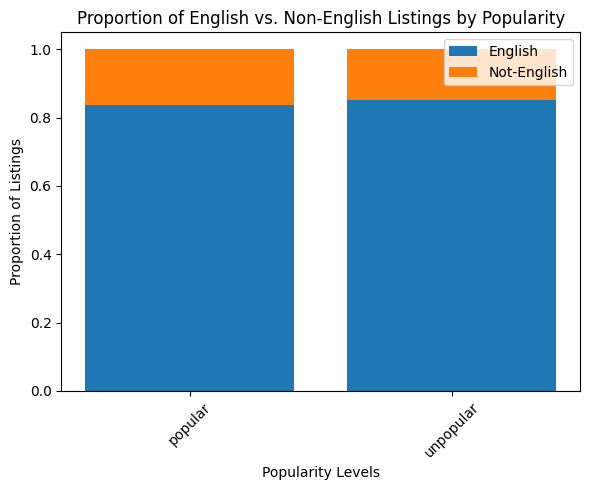

In [75]:
language_popularity = pd.crosstab(df_clean['popularity'], df_clean['language'], normalize='index').sort_index()

plt.figure(figsize=(6, 5))


plt.bar(np.arange(len(language_popularity.index)), language_popularity['English'], label='English')

plt.bar(np.arange(len(language_popularity.index)), language_popularity['Not English'], bottom=language_popularity['English'], label='Not-English')

plt.xlabel('Popularity Levels')
plt.ylabel('Proportion of Listings')
plt.legend()
plt.xticks(np.arange(len(language_popularity.index)), language_popularity.index, rotation=45)
plt.title('Proportion of English vs. Non-English Listings by Popularity')
plt.tight_layout()
plt.show()


In [76]:
language_popularity

language,English,Not English
popularity,,
popular,0.838205,0.161795
unpopular,0.850504,0.149496


Dari bar plot tersebut, kita lihat bahwa mayoritas judul listing sudah berbahasa Inggris.

Sekarang kita akan menganalisis `number_of_reviews_ltm` yang diperoleh oleh listing berbahasa Inggris dan listing berbahasa lain. Kita akan menggunakan Mann-Whitney U Test untuk melihat apakah ada perbedaan di antara keduanya.

Hipotesis:

H0: Tidak ada perbedaan signifikan jumlah review yang didapat antara listing berbahasa Inggris dan yang tidak

H1: Jumlah review yang didapat oleh listing berbahasa Inggris lebih besar daripada jumlah review yang didapat oleh listing berbahasa lain

In [77]:
t_score, pval = mannwhitneyu(df_clean[df_clean['language']=='English']['number_of_reviews'],df_clean[df_clean['language']=='Not English']['number_of_reviews'], alternative='greater')
print('p-value =', pval/2)
if pval/2 < 0.05:
  print("Tolak H0")
  print("Ada cukup bukti untuk menolak H0")
  print('Terdapat perbedaan signifikan antara jumlah review yang didapat antara listing berbahasa Inggris dan yang tidak')
else:
  print("Gagal tolak H0")
  print("Tidak ada cukup bukti untuk menolak H0")
  print('Jumlah review yang didapat oleh listing berbahasa Inggris lebih besar daripada jumlah review yang didapat oleh listing berbahasa lain')

p-value = 9.909142449539994e-07
Tolak H0
Ada cukup bukti untuk menolak H0
Terdapat perbedaan signifikan antara jumlah review yang didapat antara listing berbahasa Inggris dan yang tidak


Untuk melihat perbedaannya dengan lebih jelas, kita akan menggunakan bar plot.

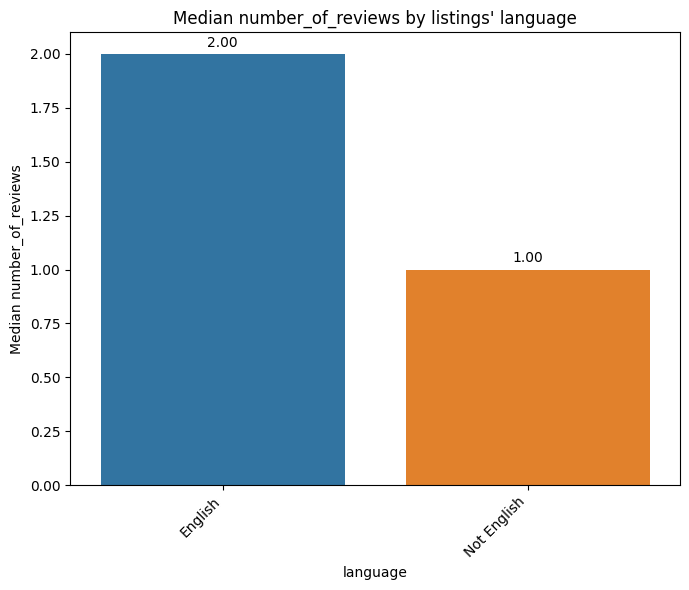

In [78]:
median_price_language = df_clean.groupby('language')['number_of_reviews'].median().reset_index().sort_values(by = 'number_of_reviews', ascending=False)
plt.figure(figsize = (7,6))
ax = sns.barplot(data=median_price_language.head(15), x='language', y='number_of_reviews', hue = 'language')
for container in ax.containers:
    ax.bar_label(container, fontsize=10, fmt='%.2f', padding=3)
plt.title('Median number_of_reviews by listings\' language')
plt.xlabel('language')
plt.ylabel('Median number_of_reviews')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Listing dengan berbahasa Inggris memiliki median number_of_reviews = 2, sedangkan listing berbahasa lain memiliki median number_of_reviews = 1. Pelancong internasional mungkin cenderung memilih listing berbahasa Inggris karena kemudahan dalam komunikasi dan pemahaman informasi tentang listing tersebut. Bahasa Inggris sebagai lingua franca global memudahkan banyak pelancong yang mungkin tidak fasih berbahasa Thailand atau bahasa lokal lainnya di Bangkok.

#### **Analysis on `price` based on listings' `language` (Mann-Whitney U Test)**

Analisis ini dapat mengidentifikasi apakah listing berbahasa Inggris cenderung memiliki tarif yang lebih tinggi dan permintaan yang kuat. Dengan informasi ini, host bisa lebih tepat dalam menargetkan segmen pasar yang bersedia membayar lebih untuk kenyamanan berkomunikasi dalam bahasa Inggris.

Kita akan menggunakan histogram untuk membandingkan *density* dsitribusi price berdasarkan bahasa dari judul listingnya. Di sini kita akan memisahkan antara listing dengan `price`  < 10000 dan listing dengan `price` >= 10000 agar visualisasi tampak lebih jelas.

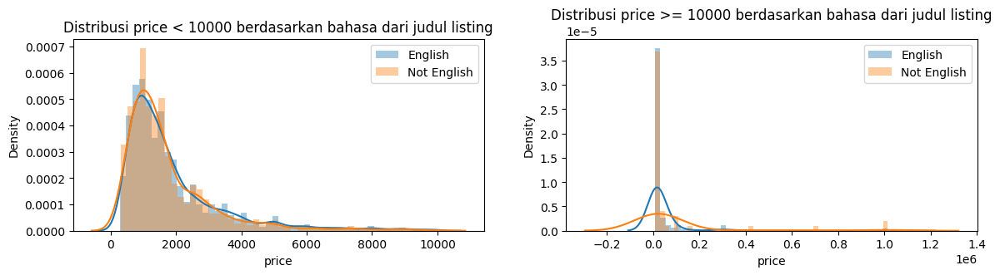

In [79]:
filter_df_10000 = df_clean[df_clean['price'] < 10000]
filter_df_above_10000 = df_clean[df_clean['price'] >= 10000]

filter_df = [filter_df_10000, filter_df_above_10000]
posisi = 1
plt.figure(figsize = (14,3))
for dataframe in filter_df:
  plt.subplot(1,2,posisi)
  sns.distplot(dataframe[dataframe['language']=='English']['price'], label='English')
  sns.distplot(dataframe[dataframe['language']=='Not English']['price'], label='Not English')
  if posisi == 1:
    plt.title('Distribusi price < 10000 berdasarkan bahasa dari judul listing')
  else:
    plt.title('Distribusi price >= 10000 berdasarkan bahasa dari judul listing')
  plt.legend()
  posisi += 1
plt.show()



Dari grafik di atas (`price` < 10000), kita lihat bahwa antara judul berbahasa Inggris dan yang tidak berbahasa Inggris memiliki bentuk distribusi yang mirip. Modus price berada di kisaran 1000 THB. Kemudian untuk (`price` >= 10000), distribusi `price` untuk judul yang tidak berbahasa Inggris lebih melebar, namun memiliki modus yang sama dengan yang berbahasa Inggris, yakni di angka 10000 THB.

Sekarang kita akan melakukan Mann-Whitney U Test untuk melihat apakah perbedaan signifikan antara tarif harian listing berbahasa Inggris dan yang tidak.

Hipotesis:

H0: Tidak ada perbedaan signifikan antara tarif harian antara listing berbahasa Inggris dan yang berbahasa lain

H1: Tarif harian listing berbahasa Inggris lebih besar daripada tarif harian listing berbahasa lain

In [80]:
t_score, pval = mannwhitneyu(df_clean[df_clean['language']=='English']['price'],df_clean[df_clean['language']=='Not English']['price'], alternative='greater')
print('p-value =', pval/2)
if pval/2 < 0.05:
  print("Tolak H0")
  print("Ada cukup bukti untuk menolak H0")
  print('Tarif harian listing berbahasa Inggris lebih besar daripada tarif harian listing berbahasa lain')
else:
  print("Gagal tolak H0")
  print("Tidak ada cukup bukti untuk menolak H0")
  print('Tidak ada perbedaan signifikan antara tarif harian antara listing berbahasa Inggris dan yang berbahasa lain')

p-value = 2.4715166820161888e-05
Tolak H0
Ada cukup bukti untuk menolak H0
Tarif harian listing berbahasa Inggris lebih besar daripada tarif harian listing berbahasa lain


Untuk melihat perbedaannya secara lebih jelas, mari kita gunakan bar plot.

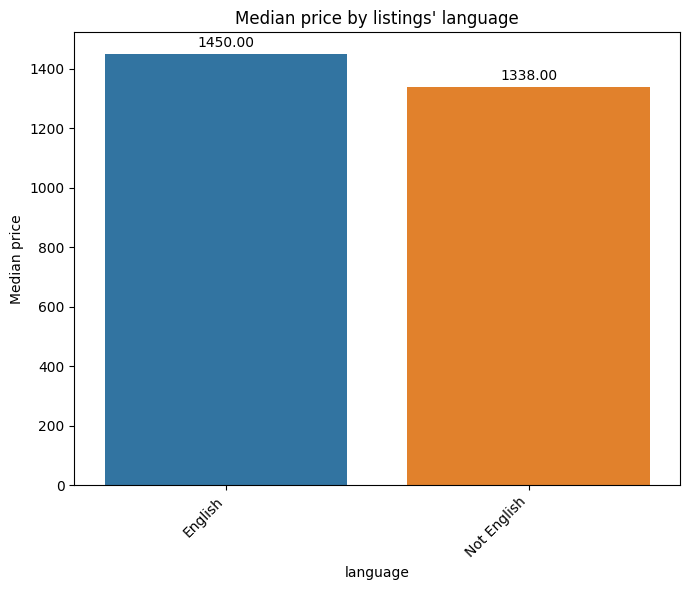

In [81]:
median_price_language = df_clean.groupby('language')['price'].median().reset_index().sort_values(by = 'price', ascending=False)
plt.figure(figsize = (7,6))
ax = sns.barplot(data=median_price_language.head(15), x='language', y='price', hue = 'language')
for container in ax.containers:
    ax.bar_label(container, fontsize=10, fmt='%.2f', padding=3)
plt.title('Median price by listings\' language')
plt.xlabel('language')
plt.ylabel('Median price')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

Median tarif harian listing berbahasa Inggris adalah 1450 THB sedangkan median tarif harian listing berbahasa lain adalah 1338 THB.

Dari perspektif bisnis, ini berarti bahwa listing berbahasa Inggris cenderung menetapkan harga yang lebih tinggi, yang mungkin mencerminkan nilai tambah yang diberikan oleh listing tersebut, seperti aksesibilitas yang lebih besar untuk pasar internasional yang lebih luas, asumsi tentang standar atau kualitas yang lebih tinggi, atau kemungkinan permintaan yang lebih tinggi.

Host di Airbnb mungkin mempertimbangkan informasi ini untuk menyusun strategi harga mereka, dan Airbnb bisa menggunakan data ini untuk menyediakan wawasan bagi host untuk menetapkan harga yang kompetitif serta untuk meningkatkan listing mereka sehingga menarik bagi pasar yang lebih global.

In [82]:
len(df_clean[df_clean['popularity'] == 'popular'])

1471

## Other analysis

### Analysis on `room_type` for each `district`
Sekarang kita akan menganalisis bagaimana `room_type` terdistribusi di ke-50 distrik di Bangkok. Informasi yang didapat dari analisis ini dapat membantu Airbnb dalam menyesuaikan algoritma penawaran mereka di setiap distrik sesuai dengan preferensi pelanggan.

Pada analisis ini, kita menggunakan tree map untuk menggambarkan proporsi dari tiap `room_type` di sebuah `district`.

In [83]:
# Grouping by district and room_type and aggregating the data
grouped_df = df_clean.groupby(['district', 'room_type']).size().reset_index(name='count')

# Creating a Treemap chart
fig = px.treemap(grouped_df, path=['district', 'room_type'], values='count')

# Updating layout
fig.update_layout(title='Room Type Distribution in Each district')
fig.show()

Tree map tersebut menunjukkan bahwa tipe `room_type` pada masing-masing `district` didominasi oleh 'Entire home/apt' dan 'Private room'. Dengan mengetahui bahwa tipe kamar "Entire home/apt" dan "Private room" mendominasi di banyak district dapat membantu host Airbnb untuk menyesuaikan penawaran mereka. Selain itu, jika ada distrik yang cenderung memiliki permintaan tinggi untuk kamar pribadi, Airbnb dapat meningkatkan jumlah penawaran kamar pribadi di wilayah tersebut untuk memaksimalkan kapasitas penuh.

# Results and Conclusion


Dari analisis yang telah dilakukan sebelumnya, ada beberapa insight yang didapat:

**General**:
1. Dari 15,846 data yang kita miliki, hanya 1471 listing yang tergolong listing populer
2. Terdapat 4 tipe kamar yang ditawarkan ('Entire home/apt', 'Private room', 'Hotel room', dan 'Shared room'). Tipe kamar yang paling banyak ditawarkan adalah 'Entire home/apt', dan 'Private room'.
3. Listing populer didominasi oleh 'Entire home/apt' dan 'Private room'
4. Vadhana, Khlong Toei, dan Huai Khwang adalah distrik dengan jumlah listing terbanyak.

**`price`**
1. Listing yang tergolong populer memiliki median tarif harian yang lebih besar daripada listing yang tidak populer.
2. Tipe kamar 'Hotel room', 'Entire home/apt', dan 'Private room' merupakan tipe kamar dengan median tarif harian tertinggi, yaitu 1700 THB, 1536 THB, 1212 THB.
3. Distrik yang berada di tengah kota memiliki median tarif harian yang lebih tinggi.
4. Nong Chok, Pathum Wan, dan Vadhana merupakan distrik dengan median tarif harian tertinggi. Sedangkan distrik dengan median tarif terendah adalah distrik yang berada di pinggir kota seperti Nong Khaem, Wang Thong Lang, dan Don Mueang.
5. Median tarif harian listing yang disewakan secara 'short-term' lebih besar dibandingkan listing yang disewakan secara 'long-term'
6. Listing yang berjudul bahasa Inggris memiliki median tarif yang lebih tinggi daripada listing yang berjudul bahasa lain.

**`popularity`**
1. Tipe kamar memengaruhi popularitas sebuah listing
2. Durasi menginap tidak memengaruhi popularitas sebuah listing
3. Listing yang populer mayoritas terletak di pusat kota, khususnya di distrik Khloeng Toei, Vadhana, Sathon, Bang Rak, Ratchathewi, Pathum Wan, dan Phaya Thai. Distrik-distrik tersebut memang terkenal dengan *night market*, *night club*, mall mewah, bar, dan hiburan lainnya.
4. Selain di pusat kota, listing populer juga ditemukan di sekitar bandara Internasional Don Mueang (distrik Don Mueang) dan bandara Suvarnabhumi (terletak distrik Bang Phli yang terletak di luar Bangkok).
5. Listing populer cenderung dimiliki oleh host yang mempunyai listing yang banyak.
6. Bahasa dari judul listing memengaruhi popularitas sebuah listing. Selain itu, listing berbahasa Inggris juga memiliki jumlah review yang lebih banyak dibandingkan listing berbahasa lainnya.

**Other analysis**
1. Tiap distrik didominasi oleh listing bertipe 'Entire home/apt' atau 'Private room'

Dari hasil analisis tersebut, kita akan menjawab pertanyaan di bagian Problem Statement:
1. Bagaimana karakteristik sebuah listing memengaruhi tarif harian yang ditetapkan oleh host? Apa saja faktor yang memengaruhi tarif harian listing?
  * Listing dengan tipe kamar 'Hotel room', 'Entire home/apt', dan 'Private room' cenderung memiliki tarif harian yang lebih tinggi. Karena 'Entire home/apt' dan 'Private room' adalah tipe yang paling populer, hal tersebut mengindikasikan penyewa Airbnb menghargai privasi dan ruang yang eksklusif.
  * Lokasi listing merupakan faktor utama yang menentukan tarif harian. Listing yang terletak di pusat kota atau distrik yang terkenal dengan kegiatan malam dan akses ke atraksi lokal memiliki tarif yang lebih tinggi. Ini menunjukkan bahwa aksesibilitas dan kedekatan dengan pusat hiburan, restoran, dan fasilitas transportasi merupakan aspek yang bersedia dibayar lebih oleh pelanggan.
  * Listing yang disewakan untuk jangka waktu 'short-term' cenderung memiliki tarif harian yang lebih tinggi dibandingkan dengan 'long-term', ini mungkin karena kenyamanan dan fleksibilitas yang lebih besar untuk tamu yang menginap dalam jangka pendek.
  * Listing dengan judul yang berbahasa Inggris cenderung ditawarkan dengan harga yang lebih tinggi. Hal tersebut mencerminkan strategi penargetan pasar yang lebih luas oleh host. Ini bisa menunjukkan bahwa dengan menggunakan judul berbahasa Inggris, host mengantisipasi atau berusaha menarik tamu internasional, yang mungkin memiliki anggaran perjalanan yang lebih besar dan mencari kenyamanan dalam komunikasi.


2.   Bagaimana karakteristik dari listing yang populer?
  *  'Entire home/apt' dan 'Private room' mendominasi daftar listing populer, menegaskan lagi bahwa pelanggan menghargai privasi dan ruang.
  * Listing populer cenderung berada di distrik-distrik pusat kota dan dekat dengan fasilitas penting seperti bandara, yang mendukung teori bahwa tamu lebih menghargai akses yang mudah ke pusat-pusat bisnis, atraksi wisata, pusat perbelanjaan, dan transportasi umum yang baik. Beberapa dari mereka mungkin adalah pelancong bisnis yang mencari kenyamanan dan kemudahan akses ke tempat-tempat penting. Selain itu, mereka juga kemungkinan turis mancanegara yang ingin mengenal budaya Thailand lewat destinasi wisata ternama di Bangkok dan masih awam dengan kota Bangkok sehingga membutuhkan pemahaman yang lebih mendalam tentang lingkungan sekitar dan fasilitas yang tersedia.
  * Listing populer cenderung dimiliki oleh host yang mempunyai banyak listing. Host dengan banyak listing mungkin memiliki lebih banyak pengalaman dan keahlian dalam menyediakan akomodasi berkualitas. Mereka mungkin lebih terbiasa dengan apa yang dicari oleh penyewa dan bagaimana memenuhi atau melebihi ekspektasi tersebut.
  * Listing dengan judul bahasa Inggris lebih populer di kalangan penyewa. Judul berbahasa Inggris mungkin lebih mudah diakses oleh pelancong internasional yang membuat listing tersebut lebih mudah ditemukan dan dipahami, dan oleh karena itu lebih mungkin untuk mendapatkan pemesanan dan ulasan.


3.   Bagaimana bahasa dari judul listing memengaruhi tarif harian listing dan popularitas listing?
  * Listing dengan judul berbahasa Inggris memiliki median tarif harian yang lebih tinggi daripada yang berjudul bahasa lain. Ini menandakan bahwa host yang menggunakan bahasa Inggris mungkin menyasar pasar internasional yang bersedia membayar lebih atau menunjukkan standar dan kualitas yang lebih tinggi, yang dapat membenarkan tarif yang lebih tinggi.
  * Judul listing berbahasa Inggris memiliki korelasi dengan jumlah ulasan yang lebih tinggi, yang dapat diinterpretasikan sebagai indikator popularitas yang lebih besar. Lebih banyak ulasan umumnya berarti lebih banyak tamu telah menginap, yang bisa diakibatkan oleh daya tarik lebih luas dari listing yang berkomunikasi dalam bahasa yang secara luas digunakan oleh pelancong internasional.

# Rekomendasi



Untuk menjawab sisa pertanyaan dari problem statement:
1. Apa yang dapat dilakukan untuk meningkatkan profit host? Bagaimana cara menetapkan harga yang bersaing?
2. Apa langkah yang dapat diambil untuk meningkatkan popularitas listing?

Host dapat menerapkan rekomendasi ini:

**Rekomendasi untuk Host**
1. **Tipe kamar**:
  * Host dengan tipe kamar 'Entire home/apt' dan 'Private room': Karena 'Entire home/apt' dan 'Private room' merupakan tipe kamar paling populer dan paling banyak di Bangkok, kompetitor yang ada juga pastinya banyak. Maka dari itu, host dapat meningkatkan daya tarik dengan menambah fasilitas ekstra yang menarik (wifi cepat, area kerja yang nyaman untuk tamu bisnis, atau dekorasi yang estetik).
  * Host dengan tipe kamar 'Hotel room': Kenyamanan dan eksklusivitas merupakan aspek penting yang sering dikaitkan dengan pengalaman menginap di hotel. Oleh karena itu, sangat penting bagi host untuk memastikan bahwa semua staf memberikan layanan yang ramah dan membantu tamu. Kemudian, tambahkan dekorasi yang ekslusif yang dapat membedakan hotel Anda dengan yang lainnya. Aspek kebersihan juga merupakan hal krusial. Hal ini dilakukan untuk memastikan bahwa tamu merasa puas dan menjadikan hotel tersebut sebagai tempat menginap mereka di masa mendatang atau mungkin merekomendasikan hotel tersebut ke orang lain.
  * Host dengan tipe kamar 'Shared room': Meskipun 'Shared room' memiliki tarif harian paling rendah, selalu pastikan ruangan dan fasilitas selalu dan terawat. Lakukan investasi dalam desain dan fasilitas bersama seperti dapur dan ruang bersama untuk mendorong interaktif positif antartamu. Kemudian, gunakan tirai atau pemisah ruangan untuk menjaga privasi dan meningkatkan kenyamanan tamu. Selain itu, buat aturan ruangan yang jelas dan tambahkan aturan ini di deskripsi listing Airbnb.
2. Sesuaikan harga listing berdasarkan standar pasar untuk tipe kamar yang ditawarkan, dengan mempertimbangkan fasilitas dan ukuran ruangan.
3. Untuk host dengan listing 'unpopular', optimalkan listing untuk pencarian dengan menggunakan kata kunci yang relevan dalam judul dan deskripsi. Kata kunci bisa mencakup nama distrik, tipe kamar, dan fasilitas unik yang ditawarkan. Selain itu, *highlight* atraksi di dekat listing yang dapat menarik pelancong. Secara aktif meminta tamu untuk meninggalkan ulasan setelah menginap. Ulasan positif meningkatkan visibilitas, daya tarik listing, popularitas. Seiring bertambahnya popularitas, host memiliki kesempatan untuk menaikkan tarif harian.
4. Utamakan kebersihan listing agar menambah kenyamanan penyewa.
5. Dari analisis judul, kita lihat bahwa mobilitas merupakan hal yang penting bagi penyewa. Sediakan penyewaan sepeda untuk meningkatkan pengalaman para tamu. Pemilik hotel juga dapat menawarkan penjemputan dan pengantaran ke bandara agar penyewa tidak usah repot mencari transportasi.
6. Pertimbangkan menggunakan strategi penetapan harga dinamis berdasarkan durasi menginap. Tingkatkan juga tarif harian ketika sedang high-season untuk mengoptimalkan pendapatan terutama pada musim liburan atau saat ada event khusus di kota.
7. Gunakan judul bahasa Inggris dan berikan deskripsi yang menarik namun jujur agar turis internasional untuk memudahkan komunikasi dan meningkatkan popularitas.
8. Gunakan judul dan deskripsi yang jelas, menarik, dan informatif. Sertakan detail tentang fasilitas unik, atraksi lokal, atau keunggulan khusus properti Anda. Pada judul listing, gunakan kata sifat yang menggambarkan listing secara jujur dan menarik, seperti 'spacious', 'cozy', 'modern', atau 'luxury', dapat membantu calon tamu membayangkan pengalaman mereka. Menambahkan wilayah listing secara spesifik, misalnya 'Sukhumvit', 'Silom', atau 'Asoke' tidak hanya membantu dalam pencarian yang ditargetkan tetapi juga memberikan rasa orientasi bagi tamu terkait dengan lingkungan tempat mereka akan menginap. Tambahkan juga fasilitas yang disediakan pada judul agar dapat user tertarik.
9. Jika listing seorang host berada di wilayah kompetitif, lakukan riset pasar untuk memahami rentang harga yang ditawarkan oleh listing serupa di area tersebut. Gunakan fitur 'Peta' di Airbnb untuk melihat harga listing lain di sekitar lokasi Anda. Pantau harga dan fasilitas yang ditawarkan oleh pesaing Anda secara berkala. Ini akan membantu Anda menentukan posisi harga yang kompetitif tanpa mengurangi nilai tawaran Anda. Tambahkan fasilitas pendukung yang berbeda dengan harga yang bersaing, seperti spa, massage, gym, dan lain-lain.
10. Apabila host memiliki listing di wilayah yang sepi pengunjung, penetapan harga yang kompetitif merupakan hal yang penting. Lakukan riset pasar untuk memastikan tarif Anda menarik dibandingkan dengan pilihan akomodasi lain di area tersebut. Pertimbangkan juga menawarkan diskon untuk masa inap yang lebih panjang atau pemesanan last-minute. Host juga dapat menceritakan tentang keindahan tersembunyi, atraksi lokal, dan alasan mengapa tamu harus mengunjungi. Gunakan kata-kata yang mengundang pada bagian deskrispsi dan gambar yang menarik untuk mengkomunikasikan pesan ini.
11. Pertimbangkan untuk menawarkan diskon untuk pemesanan jangka panjang atau di saat low season untuk meningkatkan tingkat okupansi.
12. Mengingat median tarif harian listing yang disewakan secara 'short-term' lebih besar, pertimbangkan untuk memfokuskan listing pada penyewaan jangka pendek, terutama jika berlokasi di area dengan permintaan tinggi atau pusat kota.



**Rekomendasi untuk Airbnb**

1. Kembangkan alat dan fitur baru dalam dashboard Airbnb yang membantu host mengelola listing mereka dengan lebih efisien, termasuk pengaturan harga dinamis, analisis pendapatan, dan feedback tamu.
2. Berikan penghargaan dan reward kepada listing favorit agar host termotivasi untuk terus meningkatkan layanannya. Berikan host berprestasi kesempatan untuk ikut serta dalam kampanye pemasaran Airbnb, seperti di situs web, dalam buletin email, dan di media sosial. Ini tidak hanya menghargai host tetapi juga memberikan inspirasi bagi tamu saat mencari tempat menginap.
3. Lakukan inovasi pada sistem ulasan untuk membuatnya lebih menarik bagi tamu untuk meninggalkan feedback. Contohnya pengingat otomatis pasca-checkout, insentif untuk menulis ulasan, atau memperkenalkan sistem reward untuk tamu yang sering memberikan ulasan konstruktif.
4. Sediakan sumber daya dan translator bagi host untuk membuat atau meningkatkan listing berbahasa Inggris mereka, mengingat listing berbahasa Inggris cenderung lebih populer dan memiliki tarif yang lebih tinggi.
5. Sediakan akses ke analitik pasar yang lebih mendalam dan tren pemesanan secara real-time kepada host. Hal ini dapat mereka membuat keputusan berdasarkan informasi tentang penetapan harga dan promosi listing.
6. Mengingat popularitas tertentu distrik di pusat kota, Airbnb bisa meningkatkan promosi dan dukungan untuk listing di area-area tersebut.
7. Kembangkan alat penetapan harga yang lebih canggih untuk host, memungkinkan mereka untuk secara otomatis menyesuaikan harga berdasarkan faktor-faktor seperti permintaan di area mereka, event spesial, dan tren penetapan harga pesaing.
8. Airbnb dapat memperkenalkan fitur atau filter pencarian yang lebih spesifik berdasarkan tipe kamar, memungkinkan tamu untuk lebih mudah menemukan jenis akomodasi yang paling sesuai dengan kebutuhan mereka, seperti 'Entire home/apt' untuk privasi penuh atau 'Shared room' untuk pengalaman lebih terjangkau.



# Estimasi keuntungan

Asumsi dasar:

Tarif dasar rata-rata = 1000 THB/night

Okupansi dasar rata-rata = 60% per bulan (18 malam)

**Pendapatan dasar per bulan = 18,000 THB**

**Pendapatan dasar per tahun = 216,000 THB**

**Insentif yang dibayarkan ke Airbnb per tahun = 6,480 THB/year**

1. **Penambahan Fasilitas dan Peningkatan Layanan**:

Penambahan seperti WiFi cepat, area kerja nyaman, dekorasi estetik, dan pelayanan staf yang ramah bisa meningkatkan okupansi sebesar 10% dan memungkinkan kenaikan harga sewa sebesar 5%.

Okupansi baru = 60% + 10% dari 30 hari = 21 malam.

Tarif baru = 1000 THB + 5% = **1050 THB per malam**.

Pendapatan baru = 1050 THB * 21 malam = 22,050 THB/bulan

Peningkatan Pendapatan per bulan = 22,050 THB - 18,000 THB = 4,050 THB/bulan

**Peningkatan Pendapatan per tahun = 48,600 THB/tahun**

2. **Penggunaan Strategi Penetapan Harga Dinamis dengan Peningkatan Fasilitas dan Layanan**:

Menerapkan harga dinamis saat musim liburan atau event khusus, dengan potensi kenaikan tarif hingga 30% selama periode tersebut. Asumsikan terjadi selama 30 hari.

Tarif baru = 1050 THB + 30% = 1365 THB per malam.

**Peningkatan Pendapatan (Tahunan) = (1365 THB * 30 malam)-(1,050 THB * 30 malam) = 9,450 THB/tahun**

3. **Penawaran Diskon untuk Pemesanan Jangka Panjang dan Last-Minute dengan Peningkatan Fasilitas dan Layanan**:

Diskon yang diterapkan adalah 5%. Asumsikan diskon meningkatkan okupansi sebesar 10% dan periode sepi berlangsung selama 60 hari/tahun.

Okupansi baru = 60% + 10% dari 60 hari = 42 malam.

Pendapatan lama = 1050 THB per malam * (0.6 * 60 malam/tahun) = 37,800/THB/year


Pendapatan baru per tahun = (1050 THB per malam - 5%) * 42 malam/tahun = 41,895 THB/tahun

Peningkatan pendapatan per tahun = 4,095 THB/year

.

.

.

.

**PERHITUNGAN PROFIT**:

Total peningkatan pendapatan listing per tahun = 48,600 THB + 9,450 THB + 4,095 THB = **62,145 THB**

**Insentif yang didapat oleh Airbnb** = (216,000 THB + 62,145 THB) + 3% = **8,344.35 THB**

**Peningkatan insentif yang didapat oleh Airbnb** = 10,378.35 THB - 6,480 THB = **1,864.35 THB**

**Sehingga, peningkatan pendapatan listing per tahun adalah 62,145 THB** dan **peningkatan insentif yang didapat Airbnb adalah 1,864.35 THB**.
Artinya, apabila sebuah listing menjalankan rekomendasi ini, **pendapatan host dan Airbnb berpotensi meningkat sebesar 28.771%**.





# Export Clean Dataset for Tableau

Untuk proses analisis Tableau, kita akan menggunakan data yang sudah bersih.

In [84]:
df_clean.to_excel('airbnb_clean.xlsx')